In [1]:
# Some pretty common libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import seaborn as sns
from pandas.plotting import register_matplotlib_converters
from scipy.stats import pearsonr
import statistics
import time
import plotly.express as px
import plotly.graph_objs as go


#Less common libraries

# Coint test
try:
    from arch.unitroot import engle_granger
except:
    !pip install arch
    from arch.unitroot import engle_granger
try:
    import statsmodels.api as sm
    from statsmodels.tsa.stattools import adfuller
    from statsmodels.tsa.seasonal import STL
except:
    !pip install statsmodels
    import statsmodels.api as sm
    from statsmodels.tsa.stattools import adfuller
    from statsmodels.tsa.seasonal import STL

# to check for seasonal unit root
try:
    import pmdarima as pmd
except:
    !pip install pmdarima
    import pmdarima as pmd

# Layout related
try:
    import pydove as dv
except:
    !pip install pydove
    import pydove as dv
try:
    import mpl_axes_aligner
except:
    !pip install mpl-axes-aligner
    import mpl_axes_aligner

pd.options.mode.chained_assignment = None  

# Functions

### This function aligns the origin and tick marks on two-axis graphs to improve their appearance
https://stackoverflow.com/questions/10481990/matplotlib-axis-with-two-scales-shared-origin

In [2]:
def align_yaxis(ax1, v1, ax2, v2):
    """adjust ax2 ylimit so that v2 in ax2 is aligned to v1 in ax1"""
    _, y1 = ax1.transData.transform((0, v1))
    _, y2 = ax2.transData.transform((0, v2))
    inv = ax2.transData.inverted()
    _, dy = inv.transform((0, 0)) - inv.transform((0, y1-y2))
    miny, maxy = ax2.get_ylim()
    ax2.set_ylim(miny+dy, maxy+dy)
    
# Change color of each axis
def color_y_axis(ax, color):
    """Color your axes."""
    for t in ax.get_yticklabels():
        t.set_color(color)

### This function simplifies making figures with multiple two-axis subplots
https://stackoverflow.com/questions/44825950/matplotlib-create-two-subplots-in-line-with-two-y-axes-each

In [3]:
def two_scales(ax1, time, data1, data2, c1, c2, xlabel, ylabel1, ylabel2, ylegend1, ylegend2):
    ax2 = ax1.twinx()
    ax1.plot(time, data1, color=c1, label=ylegend1)
    ax1.set_xlabel(xlabel, fontsize=17)
    ax1.set_ylabel(ylabel1, fontsize=17)
    ax2.plot(time, data2, color=c2, label=ylegend2)
    ax2.set_ylabel(ylabel2, fontsize=17)
    return ax1, ax2

def two_scales_nolabel(ax1, time, data1, data2, c1, c2, xlabel, ylabel1, ylabel2, ylegend1, ylegend2):
    ax2 = ax1.twinx()
    ax1.plot(time, data1, color=c1, label=ylegend1)
    ax1.set_xlabel(xlabel, fontsize=17)
    #ax1.set_ylabel(ylabel1, fontsize=17)
    ax2.plot(time, data2, color=c2, label=ylegend2)
    #ax2.set_ylabel(ylabel2, fontsize=17)
    return ax1, ax2

In [4]:
all_roll_avgs_short = pd.read_csv('./project_data/rolling_avgs.csv')

In [5]:
all_roll_avgs_short['Date'] = pd.to_datetime(all_roll_avgs_short['Date']).dt.date

In [6]:
all_roll_avgs_over_5k_dma = pd.read_csv('./project_data/rolling_avgs_dma.csv')

In [7]:
all_roll_avgs_over_5k_dma['Date'] = pd.to_datetime(all_roll_avgs_over_5k_dma['Date']).dt.date

In [8]:
countypop = pd.read_csv('./project_data/california_counties_population.csv')

In [9]:
dma_county_fips = pd.read_csv('./project_data/dma_county_fips.csv')

In [10]:
geoCode = dma_county_fips.loc[dma_county_fips['STATE'] == 'CA'][['geoCode','COUNTY']]

In [11]:
c1 = ['tweet_count_7dra']
c2 = ['v_allergy_cols_7dra']
c1_dma = ['tweet_count_5dra']
c2_dma = ['v_allergy_cols_5dra']

In [12]:
dma_list = [803, 807, 866, 800, 868, 828, 825, 862, 855, 771, 802]

In [13]:
d1 = [
     'tweet_count_7dra'
     ]
d2 = [
      'v_allergy_cols_7dra'
     ]

In [14]:
ca_counties_over_500k = ['Los Angeles','San Diego','Orange','Riverside','San Bernardino','Santa Clara','Alameda','Sacramento','Contra Costa','Fresno','Kern','Ventura','San Francisco','San Joaquin','San Mateo','Stanislaus']

In [15]:
#With statistical certainty markers

raw_corr2 = pd.DataFrame()

for i in ca_counties_over_500k:
    county = pd.DataFrame()
    county_name = [i]
    county = pd.DataFrame()
    county['county_name'] = county_name
    loop_pear = all_roll_avgs_short.loc[all_roll_avgs_short['county_name'] == i]
    
    for n in range(len(d1)):
        #print(n)
        #print(str(c1[n]) + ' x ' + str(c2[n]))
        x = loop_pear[d1[n]]
        #print(x.head(1))
        y = loop_pear[d2[n]]
        df = pd.DataFrame({'x':x, 'y':y})
        rho = df.corr()
        #print('head x: ' + str(x.head(1)) + ', head y: ' + str(y.head(1)))
        pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
        p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
        rho = rho.round(3).astype(str) + p
        rho_val = rho['y']['x']
        #print(rho_val)
        county[str(d1[n]) + ' x ' + str(d2[n])] = rho_val

    raw_corr2 = pd.concat((raw_corr2,county), ignore_index = True, axis = 0)  

In [16]:
# from CA census
county_pop = ['9.829544','3.286069','3.167809','2.458395','2.194710','1.885508',
              '1.648556','1.588921','1.161413','1.013581','.917673',
              '.839784','.815201','.789410','.737888','.552999']

### OLS representation of time series
We're using these to get a closer look at the residuals; I'm leaving some commented stuff in case you want to get a closer look at the residual time series

# Figure 1 - Internet-based surveillance vs ED Diagnoses

## Inputs

This section includes some hard-coded stuff which, as always, should not be hard coded, so trying to use this code on new data might take a bit of figuring out. Also, many things here should be loops but are not, appologies for the walls of duplicated code

### Twitter/county inputs

In [17]:
# Counties of interest, again some messy hard-coded stuff

ct1 = 'Los Angeles'
ct2 = 'San Diego'
ct3 = 'Sacramento'
ct4 = 'Alameda'
ct5 = 'Orange'
ct6 = 'Riverside'
ct7 = 'San Bernardino'
ct8 = 'Santa Clara'
ct9 = 'Contra Costa'
ct10 = 'Fresno'
ct11 = 'Kern'
ct12 = 'Ventura'
ct13 = 'San Francisco'
ct14 = 'San Joaquin'
ct15 = 'San Mateo'
ct16 = 'Stanislaus'

In [18]:

# List of counties
counties = [ct1, ct2, ct3, ct4, ct5, ct6, ct7, ct8, ct9, ct10, ct11, ct12, ct13, ct14, ct15, ct16]

for i, county in enumerate(counties, start=1):
    # Extract time series data
    xt = all_roll_avgs_short.loc[all_roll_avgs_short['county_name'] == str(county)]['Date']
    y1 = all_roll_avgs_short.loc[all_roll_avgs_short['county_name'] == str(county)]['v_allergy_cols_7dra']
    y2 = all_roll_avgs_short.loc[all_roll_avgs_short['county_name'] == str(county)]['tweet_count_7dra']
    
    # Create dynamic variable names
    exec(f'ct{i}_xt = xt')
    exec(f'ct{i}_y1 = y1')
    exec(f'ct{i}_y2 = y2')


In [19]:


# get the start time
st = time.time()

county_names = [ct1, ct2, ct3, ct4, ct5, ct6, ct7, ct8, ct9, ct10, ct11, ct12, ct13, ct14, ct15, ct16]
rho_values = []
rho_vals = []
pvals = []

for i, county in enumerate(county_names):
    x = all_roll_avgs_short.loc[all_roll_avgs_short['county_name'] == county]['v_allergy_cols_7dra']
    y = all_roll_avgs_short.loc[all_roll_avgs_short['county_name'] == county]['tweet_count_7dra']
    df = pd.DataFrame({'x': x, 'y': y})
    rho = df.corr()
    pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
    p = pval.applymap(lambda x: ''.join(['*' for t in [0.01, 0.05, 0.1] if x <= t]))
    rho2 = rho.round(3).astype(str) + p
    
    rho_values.append(rho2['y']['x'])
    rho_vals.append(rho['x']['y'].round(3))
    pvals.append(pval['x']['y'].round(3))


ct1_rho_val, ct2_rho_val, ct3_rho_val, ct4_rho_val, ct5_rho_val, ct6_rho_val, ct7_rho_val, ct8_rho_val, ct9_rho_val, ct10_rho_val, ct11_rho_val, ct12_rho_val, ct13_rho_val, ct14_rho_val, ct15_rho_val, ct16_rho_val = rho_values
ct1_rho, ct2_rho, ct3_rho, ct4_rho, ct5_rho, ct6_rho, ct7_rho, ct8_rho, ct9_rho, ct10_rho, ct11_rho, ct12_rho, ct13_rho, ct14_rho, ct15_rho, ct16_rho = rho_vals
ct1_pval, ct2_pval, ct3_pval, ct4_pval, ct5_pval, ct6_pval, ct7_pval, ct8_pval, ct9_pval, ct10_pval, ct11_pval, ct12_pval, ct13_pval, ct14_pval, ct15_pval, ct16_pval = pvals

########################################################################################################
        
# get the end time
et = time.time()

# get the execution time
elapsed_time = et - st
print('Execution time:', elapsed_time, 'seconds')


Execution time: 0.14740872383117676 seconds


In [20]:
# List of counties
counties = [ct1, ct2, ct3, ct4, ct5, ct6, ct7, ct8, ct9, ct10, ct11, ct12, ct13, ct14, ct15, ct16]

for i, county in enumerate(counties, start=1):
    # Apply STL decomposition
    stl_va_5 = STL(all_roll_avgs_short.loc[all_roll_avgs_short['county_name'] == county]['v_allergy_cols_7dra'], period=366, seasonal=365, seasonal_deg=0, trend_deg=0, low_pass_deg=0, robust=0)
    stl_va_5_r = stl_va_5.fit().resid
    stl_va_5_r.rename('v_allergy_resid', inplace=True)

    stl_t_5 = STL(all_roll_avgs_short.loc[all_roll_avgs_short['county_name'] == county]['tweet_count_7dra'], period=366, seasonal=365, seasonal_deg=0, trend_deg=0, low_pass_deg=0, robust=0)
    stl_t_5_r = stl_t_5.fit().resid
    stl_t_5_r.rename('twitter_count_resid', inplace=True)

    # Concatenate residuals
    residuals = pd.concat([stl_va_5_r, stl_t_5_r], axis=1)
    vallergyr = residuals['v_allergy_resid'].values
    vtwitterr = residuals['twitter_count_resid'].values

    # Calculate correlation and p-values
    df = pd.DataFrame({'x': vallergyr, 'y': vtwitterr})
    rho = df.corr()
    pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
    p = pval.applymap(lambda x: ''.join(['*' for t in [0.01, 0.05, 0.1] if x <= t]))
    rho2 = rho.round(3).astype(str) + p

    # Create dynamic variable names
    exec(f'ct{i}_stl_rho_val = rho2["y"]["x"]')
    exec(f'ct{i}_stl_rho = rho["x"]["y"].round(3)')
    exec(f'ct{i}_stl_pval = pval["x"]["y"].round(3)')

In [21]:
# List of counties
counties = [ct1, ct2, ct3, ct4, ct5, ct6, ct7, ct8, ct9, ct10, ct11, ct12, ct13, ct14, ct15, ct16]

for i, county in enumerate(counties, start=1):
    # Filter data for the current county
    ols_test = all_roll_avgs_short.loc[all_roll_avgs_short['county_name'] == county]
    
    # Define endogenous and exogenous variables
    ols_endog_y1 = ols_test['v_allergy_cols_7dra']
    ols_endog_y2 = ols_test['tweet_count_7dra']
    ols_exog = ols_test[['Date', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']]
    ols_exog['Date'] = ols_exog['Date'].apply(lambda x: x.toordinal())
    ols_exog['Date'] = ols_exog['Date'].apply(lambda x: x - 735963)
    
    # Combine into a matrix
    ols_matrix = pd.concat([ols_endog_y1, ols_endog_y2, ols_exog], axis=1)
    
    # Fit OLS models
    ols_result_y1 = sm.OLS(ols_matrix['v_allergy_cols_7dra'], ols_matrix[['Date', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']]).fit()
    ols_result_y2 = sm.OLS(ols_matrix['tweet_count_7dra'], ols_matrix[['Date', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']]).fit()
    
    # Calculate residuals
    y1resid = ols_result_y1.resid
    y2resid = ols_result_y2.resid
    
    # Calculate correlation and p-values
    df = pd.DataFrame({'x': y1resid, 'y': y2resid})
    rho = df.corr()
    pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
    p = pval.applymap(lambda x: ''.join(['*' for t in [0.01, 0.05, 0.1] if x <= t]))
    rho2 = rho.round(3).astype(str) + p
    
    # Create dynamic variable names
    exec(f'ct{i}_ols_rho_val = rho2["y"]["x"]')
    exec(f'ct{i}_ols_rho = rho["x"]["y"].round(3)')
    exec(f'ct{i}_ols_pval = pval["x"]["y"].round(3)')

### Google/DMA inputs

In [22]:
# DMAs of interest

dma1 = 803
dma2 = 825
dma3 = 862
dma4 = 807
dma5 = 828
dma6 = 802
dma7 = 868
dma8 = 866
dma9 = 855
dma10 = 800

In [23]:
# Terms of interest

gsearch_term = '/m/0cnq0_5dra'

In [24]:
#all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma6]['Date']

In [25]:
# Time series for each variable for earch county
# List of DMAs
dmas = [dma1, dma2, dma3, dma4, dma5, dma6, dma7, dma8, dma9, dma10]

for i, dma in enumerate(dmas, start=1):
    # Extract time series for current DMA
    xt = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma]['Date']
    y1 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma]['v_allergy_cols_5dra']
    y2 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma][gsearch_term]
    
    # Create dynamic variable names
    exec(f'dma{i}_xt = xt')
    exec(f'dma{i}_y1 = y1')
    exec(f'dma{i}_y2 = y2')

In [26]:
# Correlations (rho & p values)
# I think we should use rho instead of r here as we're not using a subset of the population of each county, we have all reported diagnoses and all tweets
# rho is rho obviously, p is p, rho_val is rho with *s indicative of p value
# p value is so low that it just displays as zero for most of these, consider just using rho_val
# rho in matplotlib = r"$\rho$"

# List of DMAs
dmas = [dma1, dma2, dma3, dma4, dma5, dma6, dma7, dma8, dma9, dma10]

for i, dma in enumerate(dmas, start=1):
    # Extract data for current DMA
    x = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma]['v_allergy_cols_5dra']
    y = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma][gsearch_term]
    
    # Calculate correlation and p-values
    df = pd.DataFrame({'x': x, 'y': y})
    rho = df.corr()
    pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
    p = pval.applymap(lambda x: ''.join(['*' for t in [0.01, 0.05, 0.1] if x <= t]))
    rho2 = rho.round(3).astype(str) + p
    
    # Create dynamic variable names
    exec(f'dma{i}_rho_val = rho2["y"]["x"]')
    exec(f'dma{i}_rho = rho["x"]["y"].round(3)')
    exec(f'dma{i}_pval = pval["x"]["y"].round(3)')

In [27]:
print('start')
stl_va_5 = STL(all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma1]['v_allergy_cols_5dra'], period=366, seasonal=365, seasonal_deg=0, trend_deg=0, low_pass_deg=0, robust=0)
stl_va_5_r = stl_va_5.fit().resid
stl_va_5_r.rename('v_allergy_resid',inplace=True)
stl_t_5 = STL(all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma1][gsearch_term], period=366, seasonal=365, seasonal_deg=0, trend_deg=0, low_pass_deg=0, robust=0)
stl_t_5_r = stl_t_5.fit().resid
stl_t_5_r.rename('gsearch_resid',inplace=True)
residuals = pd.concat([stl_va_5_r, stl_t_5_r], axis=1)
vallergyr = residuals['v_allergy_resid'].values
vtwitterr = residuals['gsearch_resid'].values
x = vallergyr
y = vtwitterr
df = pd.DataFrame({'x':x, 'y':y})
rho = df.corr()
pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
rho2 = rho.round(3).astype(str) + p
dma1_stl_rho_val = rho2['y']['x']
dma1_stl_rho = rho['x']['y'].round(3)
dma1_stl_pval = pval['x']['y'].round(3)
print('end')

start
end


In [28]:
# List of DMAs
dmas = [dma1, dma2, dma3, dma4, dma5, dma6, dma7, dma8, dma9, dma10]

for i, dma in enumerate(dmas, start=1):
    print(f'start {i}')
    
    # Fit STL for v_allergy_cols_5dra
    stl_va_5 = STL(all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma]['v_allergy_cols_5dra'], period=366, seasonal=365, seasonal_deg=0, trend_deg=0, low_pass_deg=0, robust=0)
    stl_va_5_r = stl_va_5.fit().resid
    stl_va_5_r.rename('v_allergy_resid', inplace=True)
    
    # Fit STL for gsearch_term
    stl_t_5 = STL(all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma][gsearch_term], period=366, seasonal=365, seasonal_deg=0, trend_deg=0, low_pass_deg=0, robust=0)
    stl_t_5_r = stl_t_5.fit().resid
    stl_t_5_r.rename('gsearch_resid', inplace=True)
    
    # Concatenate residuals
    residuals = pd.concat([stl_va_5_r, stl_t_5_r], axis=1)
    vallergyr = residuals['v_allergy_resid'].values
    vtwitterr = residuals['gsearch_resid'].values
    
    # Calculate correlation and p-values
    x = vallergyr
    y = vtwitterr
    df = pd.DataFrame({'x': x, 'y': y})
    rho = df.corr()
    pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
    p = pval.applymap(lambda x: ''.join(['*' for t in [0.01, 0.05, 0.1] if x <= t]))
    rho2 = rho.round(3).astype(str) + p
    
    # Create dynamic variable names
    exec(f'dma{i}_stl_rho_val = rho2["y"]["x"]')
    exec(f'dma{i}_stl_rho = rho["x"]["y"].round(3)')
    exec(f'dma{i}_stl_pval = pval["x"]["y"].round(3)')


start 1
start 2
start 3
start 4
start 5
start 6
start 7
start 8
start 9
start 10


In [29]:
# List of DMAs
dmas = [dma1, dma2, dma3, dma4, dma5, dma6, dma7, dma8, dma9, dma10]

for i, dma in enumerate(dmas, start=1):
    # Filter data for the current DMA
    ols_test = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma]
    
    # Define endogenous and exogenous variables
    ols_endog_y1 = ols_test['v_allergy_cols_5dra']
    ols_endog_y2 = ols_test[gsearch_term]
    ols_exog = ols_test[['Date', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']]
    ols_exog['Date'] = ols_exog['Date'].apply(lambda x: x.toordinal())
    ols_exog['Date'] = ols_exog['Date'].apply(lambda x: x - 735963)
    
    # Combine into a matrix
    ols_matrix = pd.concat([ols_endog_y1, ols_endog_y2, ols_exog], axis=1)
    
    # Fit OLS models
    ols_result_y1 = sm.OLS(ols_matrix['v_allergy_cols_5dra'], ols_matrix[['Date', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']]).fit()
    ols_result_y2 = sm.OLS(ols_matrix[gsearch_term], ols_matrix[['Date', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']]).fit()
    
    # Calculate residuals
    y1resid = ols_result_y1.resid
    y2resid = ols_result_y2.resid
    
    # Calculate correlation and p-values
    df = pd.DataFrame({'x': y1resid, 'y': y2resid})
    rho = df.corr()
    pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
    p = pval.applymap(lambda x: ''.join(['*' for t in [0.01, 0.05, 0.1] if x <= t]))
    rho2 = rho.round(3).astype(str) + p
    
    # Create dynamic variable names
    exec(f'dma{i}_ols_rho_val = rho2["y"]["x"]')
    exec(f'dma{i}_ols_rho = rho["x"]["y"].round(3)')
    exec(f'dma{i}_ols_pval = pval["x"]["y"].round(3)')

## Build Figure

### Figure 1a: Twitter

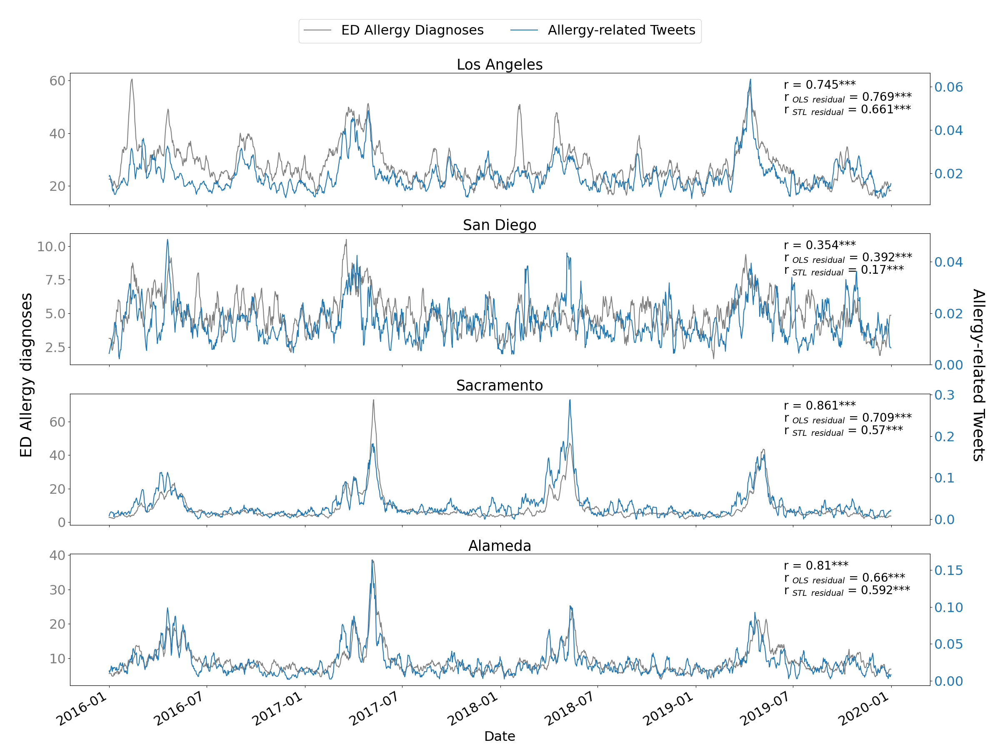

"\nplt.tick_params(\n    axis='x',          # changes apply to the x-axis\n    which='both',      # both major and minor ticks are affected\n    bottom=False,      # ticks along the bottom edge are off\n    top=False,         # ticks along the top edge are off\n    labelbottom=False) # labels along the bottom edge are off\n"

In [30]:
# Name axes
xlabel='Date'
ylabel1='ED Allergy Diagnoses'
ylabel2='Allergy-related Tweets'
ylegend1='ED Allergy Diagnoses'
ylegend2='Allergy-related Tweets'

fontsize_text = 27
fontsize_labels = 23
fontsize_annotations = 20
fontsize_titles = 25
fontsize_legend = 23
fontsize_suptitle = 35

# Create axes
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4,1, figsize=(24, 18))
fig.text(0.02, 0.5, 'ED Allergy diagnoses', va='center', rotation=90, fontsize=fontsize_text)
fig.text(0.97, 0.5, 'Allergy-related Tweets', va='center', rotation=-90, fontsize=fontsize_text)

ax1.set_title(str(ct1), fontsize=fontsize_titles)
ax1, ax1a = two_scales_nolabel(ax1, ct1_xt, ct1_y1, ct1_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax1.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax1a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax1.annotate('r' + ' = ' + str(ct1_rho_val), xy=(.83, .95),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
ax1.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct1_ols_rho_val), xy=(.83, .86),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
ax1.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct1_stl_rho_val), xy=(.83, .765),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')

ax2.set_title(str(ct2), fontsize=fontsize_titles)
ax2, ax2a = two_scales_nolabel(ax2, ct2_xt, ct2_y1, ct2_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax2.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax2a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax2.annotate('r' + ' = ' + str(ct2_rho_val), xy=(.83, .95),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
ax2.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct2_ols_rho_val), xy=(.83, .86),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
ax2.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct2_stl_rho_val), xy=(.83, .765),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')

ax3.set_title(str(ct3), fontsize=fontsize_titles)
ax3, ax3a = two_scales_nolabel(ax3, ct3_xt, ct3_y1, ct3_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax3.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax3a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax3.annotate('r' + ' = ' + str(ct3_rho_val), xy=(.83, .95),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
ax3.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct3_ols_rho_val), xy=(.83, .86),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
ax3.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct3_stl_rho_val), xy=(.83, .765),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')

ax4.set_title(str(ct4), fontsize=fontsize_titles)
ax4, ax4a = two_scales_nolabel(ax4, ct4_xt, ct4_y1, ct4_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax4.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax4a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax4.annotate('r' + ' = ' + str(ct4_rho_val), xy=(.83, .95),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
ax4.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct4_ols_rho_val), xy=(.83, .86),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
ax4.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct4_stl_rho_val), xy=(.83, .765),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')

color_y_axis(ax1, 'tab:grey')
color_y_axis(ax1a, 'tab:blue')
color_y_axis(ax2, 'tab:grey')
color_y_axis(ax2a, 'tab:blue')
color_y_axis(ax3, 'tab:grey')
color_y_axis(ax3a, 'tab:blue')
color_y_axis(ax4, 'tab:grey')
color_y_axis(ax4a, 'tab:blue')

handles, labels = ax1.get_legend_handles_labels()
handles2, labels2 = ax1a.get_legend_handles_labels()
ax1.legend(handles + handles2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, 1.46), ncol=3, fontsize=fontsize_legend)

#fig.suptitle("ED Allergy Diagnoses vs Allergy-related Tweets, 5-day Rolling Average", fontsize=fontsize_suptitle)
fig.autofmt_xdate()

ax4.xaxis.label.set_fontsize(fontsize_labels)

#plt.tight_layout(rect=[0.04, 0.03, .96, .98])
plt.tight_layout(rect=[0.03, 0, .97, .97])
plt.show()

image_format = 'svg' # e.g .png, .svg, etc.
image_name = 'fig1.svg'

fig.savefig(image_name, format=image_format, dpi=5000)
'''
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off
'''

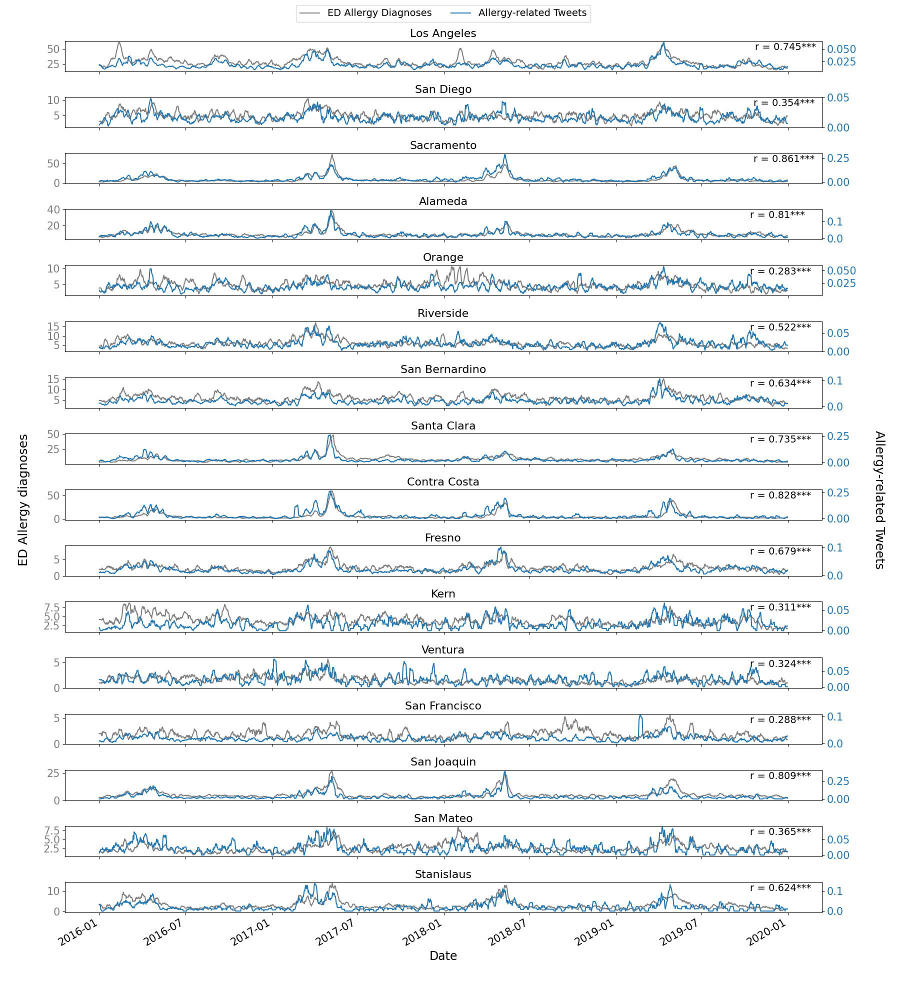

"\nplt.tick_params(\n    axis='x',          # changes apply to the x-axis\n    which='both',      # both major and minor ticks are affected\n    bottom=False,      # ticks along the bottom edge are off\n    top=False,         # ticks along the top edge are off\n    labelbottom=False) # labels along the bottom edge are off\n"

In [31]:
# Name axes
xlabel='Date'
ylabel1='ED Allergy Diagnoses'
ylabel2='Allergy-related Tweets'
ylegend1='ED Allergy Diagnoses'
ylegend2='Allergy-related Tweets'

# Create axes
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12, ax13, ax14, ax15, ax16) = plt.subplots(16,1, figsize=(18, 20))
fig.text(0.02, 0.5, 'ED Allergy diagnoses', va='center', rotation=90, fontsize=18)
fig.text(0.97, 0.5, 'Allergy-related Tweets', va='center', rotation=-90, fontsize=18)

ax1.set_title(str(ct1), fontsize=16)
ax1, ax1a = two_scales_nolabel(ax1, ct1_xt, ct1_y1, ct1_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax1.tick_params(axis='both', which='major', labelsize=15)
ax1a.tick_params(axis='both', which='major', labelsize=15)
ax1.annotate('r' + ' = ' + str(ct1_rho_val), xy=(.9115, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')
#ax1.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct1_stl_rho_val), xy=(.953, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax1.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct1_ols_rho_val), xy=(.953, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax2.set_title(str(ct2), fontsize=16)
ax2, ax2a = two_scales_nolabel(ax2, ct2_xt, ct2_y1, ct2_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax2.tick_params(axis='both', which='major', labelsize=15)
ax2a.tick_params(axis='both', which='major', labelsize=15)
ax2.annotate('r' + ' = ' + str(ct2_rho_val), xy=(.91, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')
#ax2.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct2_stl_rho_val), xy=(.952, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax2.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct2_ols_rho_val), xy=(.953, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax3.set_title(str(ct3), fontsize=16)
ax3, ax3a = two_scales_nolabel(ax3, ct3_xt, ct3_y1, ct3_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax3.tick_params(axis='both', which='major', labelsize=15)
ax3a.tick_params(axis='both', which='major', labelsize=15)
ax3.annotate('r' + ' = ' + str(ct3_rho_val), xy=(.91, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')
#ax3.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct3_stl_rho_val), xy=(.946, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax3.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct3_ols_rho_val), xy=(.953, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax4.set_title(str(ct4), fontsize=16)
ax4, ax4a = two_scales_nolabel(ax4, ct4_xt, ct4_y1, ct4_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax4.tick_params(axis='both', which='major', labelsize=15)
ax4a.tick_params(axis='both', which='major', labelsize=15)
ax4.annotate('r' + ' = ' + str(ct4_rho_val), xy=(.905, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')
#ax4.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct4_stl_rho_val), xy=(.9467, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax4.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct4_ols_rho_val), xy=(.95345, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax5.set_title(str(ct5), fontsize=16)
ax5, ax5a = two_scales_nolabel(ax5, ct5_xt, ct5_y1, ct5_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax5.tick_params(axis='both', which='major', labelsize=15)
ax5a.tick_params(axis='both', which='major', labelsize=15)
ax5.annotate('r' + ' = ' + str(ct5_rho_val), xy=(.905, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')
#ax5.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct5_stl_rho_val), xy=(.9467, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax5.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct5_ols_rho_val), xy=(.95345, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax6.set_title(str(ct6), fontsize=16)
ax6, ax6a = two_scales_nolabel(ax6, ct6_xt, ct6_y1, ct6_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax6.tick_params(axis='both', which='major', labelsize=15)
ax6a.tick_params(axis='both', which='major', labelsize=15)
ax6.annotate('r' + ' = ' + str(ct6_rho_val), xy=(.905, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')
#ax6.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct6_stl_rho_val), xy=(.9467, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax6.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct6_ols_rho_val), xy=(.95345, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax7.set_title(str(ct7), fontsize=16)
ax7, ax7a = two_scales_nolabel(ax7, ct7_xt, ct7_y1, ct7_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax7.tick_params(axis='both', which='major', labelsize=15)
ax7a.tick_params(axis='both', which='major', labelsize=15)
ax7.annotate('r' + ' = ' + str(ct7_rho_val), xy=(.905, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')
#ax7.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct7_stl_rho_val), xy=(.9467, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax7.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct7_ols_rho_val), xy=(.95345, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax8.set_title(str(ct8), fontsize=16)
ax8, ax8a = two_scales_nolabel(ax8, ct8_xt, ct8_y1, ct8_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax8.tick_params(axis='both', which='major', labelsize=15)
ax8a.tick_params(axis='both', which='major', labelsize=15)
ax8.annotate('r' + ' = ' + str(ct8_rho_val), xy=(.905, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')
#ax8.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct8_stl_rho_val), xy=(.9467, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax8.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct8_ols_rho_val), xy=(.95345, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax9.set_title(str(ct9), fontsize=16)
ax9, ax9a = two_scales_nolabel(ax9, ct9_xt, ct9_y1, ct9_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax9.tick_params(axis='both', which='major', labelsize=15)
ax9a.tick_params(axis='both', which='major', labelsize=15)
ax9.annotate('r' + ' = ' + str(ct9_rho_val), xy=(.905, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')
#ax9.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct9_stl_rho_val), xy=(.9467, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax9.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct9_ols_rho_val), xy=(.95345, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax10.set_title(str(ct10), fontsize=16)
ax10, ax10a = two_scales_nolabel(ax10, ct10_xt, ct10_y1, ct10_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax10.tick_params(axis='both', which='major', labelsize=15)
ax10a.tick_params(axis='both', which='major', labelsize=15)
ax10.annotate('r' + ' = ' + str(ct10_rho_val), xy=(.905, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')
#ax10.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct10_stl_rho_val), xy=(.9467, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax10.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct10_ols_rho_val), xy=(.95345, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax11.set_title(str(ct11), fontsize=16)
ax11, ax11a = two_scales_nolabel(ax11, ct11_xt, ct11_y1, ct11_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax11.tick_params(axis='both', which='major', labelsize=15)
ax11a.tick_params(axis='both', which='major', labelsize=15)
ax11.annotate('r' + ' = ' + str(ct11_rho_val), xy=(.905, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')
#ax11.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct11_stl_rho_val), xy=(.9467, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax11.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct11_ols_rho_val), xy=(.95345, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax12.set_title(str(ct12), fontsize=16)
ax12, ax12a = two_scales_nolabel(ax12, ct12_xt, ct12_y1, ct12_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax12.tick_params(axis='both', which='major', labelsize=15)
ax12a.tick_params(axis='both', which='major', labelsize=15)
ax12.annotate('r' + ' = ' + str(ct12_rho_val), xy=(.905, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')
#ax12.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct12_stl_rho_val), xy=(.9467, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax12.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct12_ols_rho_val), xy=(.95345, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax13.set_title(str(ct13), fontsize=16)
ax13, ax13a = two_scales_nolabel(ax13, ct13_xt, ct13_y1, ct13_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax13.tick_params(axis='both', which='major', labelsize=15)
ax13a.tick_params(axis='both', which='major', labelsize=15)
ax13.annotate('r' + ' = ' + str(ct13_rho_val), xy=(.905, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')
#ax13.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct13_stl_rho_val), xy=(.9467, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax13.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct13_ols_rho_val), xy=(.95345, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax14.set_title(str(ct14), fontsize=16)
ax14, ax14a = two_scales_nolabel(ax14, ct14_xt, ct14_y1, ct14_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax14.tick_params(axis='both', which='major', labelsize=15)
ax14a.tick_params(axis='both', which='major', labelsize=15)
ax14.annotate('r' + ' = ' + str(ct14_rho_val), xy=(.905, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')
#ax14.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct14_stl_rho_val), xy=(.9467, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax14.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct14_ols_rho_val), xy=(.95345, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax15.set_title(str(ct15), fontsize=16)
ax15, ax15a = two_scales_nolabel(ax15, ct15_xt, ct15_y1, ct15_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax15.tick_params(axis='both', which='major', labelsize=15)
ax15a.tick_params(axis='both', which='major', labelsize=15)
ax15.annotate('r' + ' = ' + str(ct15_rho_val), xy=(.905, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')
#ax15.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct15_stl_rho_val), xy=(.9467, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax15.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct15_ols_rho_val), xy=(.95345, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax16.set_title(str(ct16), fontsize=16)
ax16, ax16a = two_scales_nolabel(ax16, ct16_xt, ct16_y1, ct16_y2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax16.tick_params(axis='both', which='major', labelsize=15)
ax16a.tick_params(axis='both', which='major', labelsize=15)
ax16.annotate('r' + ' = ' + str(ct16_rho_val), xy=(.905, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')
#ax16.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(ct16_stl_rho_val), xy=(.9467, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax16.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct16_ols_rho_val), xy=(.95345, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')


color_y_axis(ax1, 'tab:grey')
color_y_axis(ax1a, 'tab:blue')
color_y_axis(ax2, 'tab:grey')
color_y_axis(ax2a, 'tab:blue')
color_y_axis(ax3, 'tab:grey')
color_y_axis(ax3a, 'tab:blue')
color_y_axis(ax4, 'tab:grey')
color_y_axis(ax4a, 'tab:blue')
color_y_axis(ax5, 'tab:grey')
color_y_axis(ax5a, 'tab:blue')
color_y_axis(ax6, 'tab:grey')
color_y_axis(ax6a, 'tab:blue')
color_y_axis(ax7, 'tab:grey')
color_y_axis(ax7a, 'tab:blue')
color_y_axis(ax8, 'tab:grey')
color_y_axis(ax8a, 'tab:blue')
color_y_axis(ax9, 'tab:grey')
color_y_axis(ax9a, 'tab:blue')
color_y_axis(ax10, 'tab:grey')
color_y_axis(ax10a, 'tab:blue')
color_y_axis(ax11, 'tab:grey')
color_y_axis(ax11a, 'tab:blue')
color_y_axis(ax12, 'tab:grey')
color_y_axis(ax12a, 'tab:blue')
color_y_axis(ax13, 'tab:grey')
color_y_axis(ax13a, 'tab:blue')
color_y_axis(ax14, 'tab:grey')
color_y_axis(ax14a, 'tab:blue')
color_y_axis(ax15, 'tab:grey')
color_y_axis(ax15a, 'tab:blue')
color_y_axis(ax16, 'tab:grey')
color_y_axis(ax16a, 'tab:blue')

handles, labels = ax1.get_legend_handles_labels()
handles2, labels2 = ax1a.get_legend_handles_labels()
ax1.legend(handles + handles2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, 2.35), ncol=3, fontsize=14)

#fig.suptitle("ED Allergy Diagnoses vs Allergy-related Tweets, 7-day Rolling Average", fontsize=20)
fig.autofmt_xdate()

#fig.write_image("fig1_corrected.svg")

plt.tight_layout(rect=[0.04, 0.03, .96, 1.01])
#plt.tight_layout(rect=[0, 0.03, 1, .98])
plt.show()


'''
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off
'''

### Figure 1b: Google

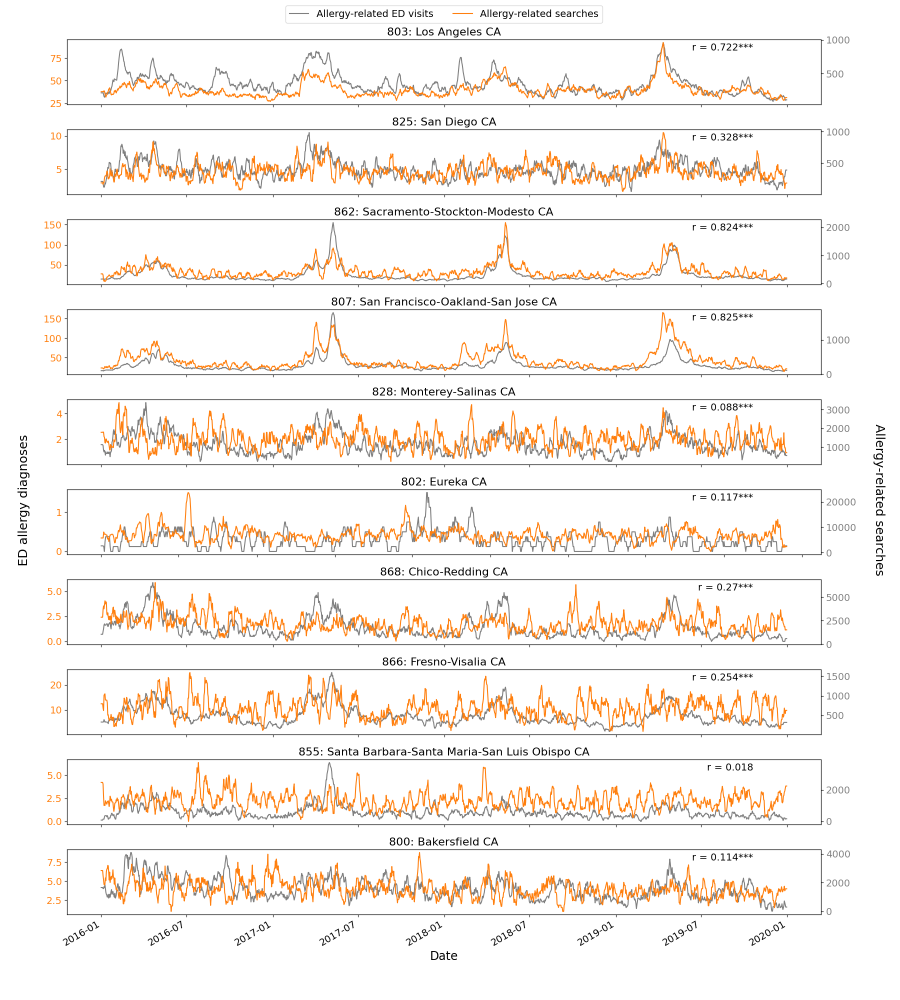

In [32]:
# Name axes
xlabel = 'Date'
ylabel1='Allergy-related ED visits'
ylabel2='Allergy-related searches'
ylegend1='Allergy-related ED visits'
ylegend2='Allergy-related searches'




# Create axes
#fig, (ax1, ax2, ax3, ax4) = plt.subplots(4,1, figsize=(24, 18))
# Create axes
#fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8), (ax9, ax10)) = plt.subplots(5,2, figsize=(24, 18))
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10) = plt.subplots(10,1, figsize=(18, 20))

fig.text(0.02, 0.5, 'ED allergy diagnoses', va='center', rotation=90, fontsize=18)
fig.text(0.97, 0.5, 'Allergy-related searches', va='center', rotation=-90, fontsize=18)

ax1.set_title(str(dma1) + ': Los Angeles CA', fontsize=16)
ax1, ax1a = two_scales_nolabel(ax1, dma1_xt.tail(1461), dma1_y1.tail(1461), dma1_y2.tail(1461), 'tab:grey', 'tab:orange', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax1.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax1a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax1.annotate('r' + ' = ' + str(dma1_rho_val), xy=(.91, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax1.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(dma1_stl_rho_val), xy=(.952, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax1.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(dma1_ols_rho_val), xy=(.953, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax2.set_title(str(dma2) + ': San Diego CA', fontsize=16)
ax2, ax2a = two_scales_nolabel(ax2, dma2_xt.tail(1461), dma2_y1.tail(1461), dma2_y2.tail(1461), 'tab:grey', 'tab:orange', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax2.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax2a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax2.annotate('r' + ' = ' + str(dma2_rho_val), xy=(.91, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax2.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(dma2_stl_rho_val), xy=(.952, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax2.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(dma2_ols_rho_val), xy=(.953, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax3.set_title(str(dma3) + ': Sacramento-Stockton-Modesto CA', fontsize=16)
ax3, ax3a = two_scales_nolabel(ax3, dma3_xt.tail(1461), dma3_y1.tail(1461), dma3_y2.tail(1461), 'tab:grey', 'tab:orange', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax3.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax3a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax3.annotate('r' + ' = ' + str(dma3_rho_val), xy=(.91, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax3.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(dma3_stl_rho_val), xy=(.952, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax3.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(dma3_ols_rho_val), xy=(.953, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax4.set_title(str(dma4) + ': San Francisco-Oakland-San Jose CA', fontsize=16)
ax4, ax4a = two_scales_nolabel(ax4, dma4_xt.tail(1461), dma4_y1.tail(1461), dma4_y2.tail(1461), 'tab:grey', 'tab:orange', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax4.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax4a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax4.annotate('r' + ' = ' + str(dma4_rho_val), xy=(.91, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax4.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(dma4_stl_rho_val), xy=(.952, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax4.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(dma4_ols_rho_val), xy=(.948, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax5.set_title(str(dma5) + ': Monterey-Salinas CA', fontsize=16)
ax5, ax5a = two_scales_nolabel(ax5, dma5_xt.tail(1461), dma5_y1.tail(1461), dma5_y2.tail(1461), 'tab:grey', 'tab:orange', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax5.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax5a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax5.annotate('r' + ' = ' + str(dma5_rho_val), xy=(.91, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax5.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(dma5_stl_rho_val), xy=(.952, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax5.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(dma5_ols_rho_val), xy=(.953, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax6.set_title(str(dma6) + ': Eureka CA', fontsize=16)
ax6, ax6a = two_scales_nolabel(ax6, dma6_xt.tail(1461), dma6_y1.tail(1461), dma6_y2.tail(1461), 'tab:grey', 'tab:orange', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax6.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax6a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax6.annotate('r' + ' = ' + str(dma6_rho_val), xy=(.91, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax6.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(dma6_stl_rho_val), xy=(.952, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax6.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(dma6_ols_rho_val), xy=(.953, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax7.set_title(str(dma7) + ': Chico-Redding CA', fontsize=16)
ax7, ax7a = two_scales_nolabel(ax7, dma7_xt.tail(1461), dma7_y1.tail(1461), dma7_y2.tail(1461), 'tab:grey', 'tab:orange', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax7.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax7a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax7.annotate('r' + ' = ' + str(dma7_rho_val), xy=(.91, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax7.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(dma7_stl_rho_val), xy=(.952, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax7.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(dma7_ols_rho_val), xy=(.953, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax8.set_title(str(dma8) + ': Fresno-Visalia CA', fontsize=16)
ax8, ax8a = two_scales_nolabel(ax8, dma8_xt.tail(1461), dma8_y1.tail(1461), dma8_y2.tail(1461), 'tab:grey', 'tab:orange', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax8.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax8a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax8.annotate('r' + ' = ' + str(dma8_rho_val), xy=(.91, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax8.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(dma8_stl_rho_val), xy=(.952, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax8.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(dma8_ols_rho_val), xy=(.948, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax9.set_title(str(dma9) + ': Santa Barbara-Santa Maria-San Luis Obispo CA', fontsize=16)
ax9, ax9a = two_scales_nolabel(ax9, dma9_xt.tail(1461), dma9_y1.tail(1461), dma9_y2.tail(1461), 'tab:grey', 'tab:orange', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax9.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax9a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax9.annotate('r' + ' = ' + str(dma9_rho_val), xy=(.91, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax9.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(dma9_stl_rho_val), xy=(.952, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax9.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(dma9_ols_rho_val), xy=(.953, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

ax10.set_title(str(dma10) + ': Bakersfield CA', fontsize=16)
ax10, ax10a = two_scales_nolabel(ax10, dma10_xt.tail(1461), dma10_y1.tail(1461), dma10_y2.tail(1461), 'tab:grey', 'tab:orange', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax10.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax10a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax10.annotate('r' + ' = ' + str(dma10_rho_val), xy=(.91, .95),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax10.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(dma10_stl_rho_val), xy=(.952, .79),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')
#ax10.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(dma10_ols_rho_val), xy=(.948, .87),xycoords='axes fraction', fontsize=14, horizontalalignment='right', verticalalignment='top')

###

color_y_axis(ax1, 'tab:orange')
color_y_axis(ax1a, 'tab:grey')
color_y_axis(ax2, 'tab:orange')
color_y_axis(ax2a, 'tab:grey')
color_y_axis(ax3, 'tab:orange')
color_y_axis(ax3a, 'tab:grey')
color_y_axis(ax4, 'tab:orange')
color_y_axis(ax4a, 'tab:grey')
color_y_axis(ax5, 'tab:orange')
color_y_axis(ax5a, 'tab:grey')
color_y_axis(ax6, 'tab:orange')
color_y_axis(ax6a, 'tab:grey')
color_y_axis(ax7, 'tab:orange')
color_y_axis(ax7a, 'tab:grey')
color_y_axis(ax8, 'tab:orange')
color_y_axis(ax8a, 'tab:grey')
color_y_axis(ax9, 'tab:orange')
color_y_axis(ax9a, 'tab:grey')
color_y_axis(ax10, 'tab:orange')
color_y_axis(ax10a, 'tab:grey')

handles, labels = ax1.get_legend_handles_labels()
handles2, labels2 = ax1a.get_legend_handles_labels()
#ax1.legend(handles + handles2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, 1.24), ncol=3, fontsize=14)

#fig.suptitle("ED Allergy Diagnoses vs Allergy-related Google Searches, 7-day Rolling Average", y=0.988, fontsize=20)
fig.autofmt_xdate()

plt.tight_layout(rect=[0.04, 0.03, .96, .98])
#plt.tight_layout(rect=[0, 0.03, 1, 0.97])
ax1.legend(handles + handles2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, 1.6), ncol=2, fontsize=14)
plt.show()

# Figure 2 - Population/Search & Volume/Tweet & Population/Tweet Correlations

### 2a - Twitter

In [33]:
# With statistical certainty markers
# all_counties, all_roll_avgs
# ca_counties_over_500k, all_roll_avgs_over_5k


raw_corr = pd.DataFrame()

for i in ca_counties_over_500k:
    county = pd.DataFrame()
    county_name = [i]
    county = pd.DataFrame()
    county['county_name'] = county_name
    loop_pear = all_roll_avgs_short.loc[all_roll_avgs_short['county_name'] == i]
    
    
    #######################
    ## Column selection
    #######################
    for n in range(len(c1)):
        #print(str(c1[n]) + ' x ' + str(c2[n]))
        x = loop_pear[c1[n]]
        #print(x.head(1))
        y = loop_pear[c2[n]]
        df = pd.DataFrame({'x':x, 'y':y})
        rho = df.corr()
        #print('head x: ' + str(x.head(1)) + ', head y: ' + str(y.head(1)))
        pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
        p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
        rho = rho.round(3).astype(str) + p
        rho_val = rho['y']['x']
        county[str(c1[n]) + ' x ' + str(c2[n])] = rho_val

    raw_corr = pd.concat((raw_corr,county), ignore_index = True, axis = 0)
    #raw_corr = raw_corr.append(county, ignore_index = True)    

In [34]:
#inner_joined_total = inner_joined_total[['Date','county_name','DMA','tweet_count','v_allergy_cols']]

In [35]:
corr_no_p = pd.DataFrame(raw_corr[['county_name','tweet_count_7dra x v_allergy_cols_7dra']])
corr_no_p['tweet_count_7dra x v_allergy_cols_7dra'] = corr_no_p['tweet_count_7dra x v_allergy_cols_7dra'].map(lambda x: x.replace('***',''))
corr_no_p['tweet_count_7dra x v_allergy_cols_7dra'] = corr_no_p['tweet_count_7dra x v_allergy_cols_7dra'].astype(float)
corr_no_p.rename(columns={"tweet_count_7dra x v_allergy_cols_7dra": "r"},inplace=True)
county_tweets = pd.DataFrame(all_roll_avgs_short.groupby(['county_name'])['tweet_count','v_allergy_cols'].sum())
county_name = corr_no_p['county_name']
cname = pd.DataFrame(county_name)
county_by_pop = cname.merge(countypop[['county_name','Population']], on=['county_name'])
p_vs_tweets = corr_no_p.merge(county_tweets, on=['county_name']).merge(county_by_pop, on=['county_name'])
p_vs_tweets['tweets_per_100k'] = p_vs_tweets['tweet_count']/p_vs_tweets['Population']*100000
p_vs_tweets['visits_per_100k'] = p_vs_tweets['v_allergy_cols']/p_vs_tweets['Population']*100000

<ipython-input-35-5a1fb86fe1bc>:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  county_tweets = pd.DataFrame(all_roll_avgs_short.groupby(['county_name'])['tweet_count','v_allergy_cols'].sum())


In [36]:
p_vs_tweets_twitter = pd.DataFrame(p_vs_tweets)

### 2b - Google

771 = 'Yuma AZ-El Centro CA'

800 = 'Bakersfield CA'

802 = 'Eureka CA'

803 = 'Los Angeles CA'

804 = 'Palm Springs CA'

807 = 'San Francisco-Oakland-San Jose CA'

825 = 'San Diego CA'

828 = 'Monterey-Salinas CA'

855 = 'Santa Barbara-Santa Maria-San Luis Obispo CA'

862 = 'Sacramento-Stockton-Modesto CA'

866 = 'Fresno-Visalia CA'

868 = 'Chico-Redding CA'

In [37]:
# With statistical certainty markers
# all_counties, all_roll_avgs
# ca_counties_over_500k, all_roll_avgs_over_5k


raw_corr = pd.DataFrame()

for i in dma_list:
    dma = pd.DataFrame()
    dma_name = [i]
    #county = pd.DataFrame()
    dma['DMA'] = dma_name
    loop_pear = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == i]
    
    
    #######################
    ## Column selection
    #######################
    for n in range(len(c1_dma)):
        #print(str(c1[n]) + ' x ' + str(c2[n]))
        x = loop_pear[c1_dma[n]]
        #print(x.head(1))
        y = loop_pear[c2_dma[n]]
        df = pd.DataFrame({'x':x, 'y':y})
        rho = df.corr()
        #print('head x: ' + str(x.head(1)) + ', head y: ' + str(y.head(1)))
        pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
        p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
        rho = rho.round(3).astype(str) + p
        rho_val = rho['y']['x']
        dma[str(c1_dma[n]) + ' x ' + str(c2_dma[n])] = rho_val

    raw_corr = pd.concat((raw_corr,dma), ignore_index = True, axis = 0)
    #raw_corr = raw_corr.append(dma, ignore_index = True)    

In [38]:
corr_no_p = pd.DataFrame(raw_corr[['DMA','tweet_count_5dra x v_allergy_cols_5dra']])
corr_no_p['tweet_count_5dra x v_allergy_cols_5dra'] = corr_no_p['tweet_count_5dra x v_allergy_cols_5dra'].map(lambda x: x.replace('***',''))
corr_no_p['tweet_count_5dra x v_allergy_cols_5dra'] = corr_no_p['tweet_count_5dra x v_allergy_cols_5dra'].map(lambda x: x.replace('**',''))
corr_no_p['tweet_count_5dra x v_allergy_cols_5dra'] = corr_no_p['tweet_count_5dra x v_allergy_cols_5dra'].map(lambda x: x.replace('*',''))
corr_no_p['tweet_count_5dra x v_allergy_cols_5dra'] = corr_no_p['tweet_count_5dra x v_allergy_cols_5dra'].astype(float)
corr_no_p.rename(columns={"tweet_count_5dra x v_allergy_cols_5dra": "r"},inplace=True)
county_tweets = pd.DataFrame(all_roll_avgs_over_5k_dma.groupby(['DMA'])['tweet_count','v_allergy_cols'].sum())
county_name = corr_no_p['DMA']
cname = pd.DataFrame(county_name)

dma_pops = pd.DataFrame(countypop).merge(geoCode, left_on='county_name', right_on='COUNTY')
dma_pops = pd.DataFrame(dma_pops.groupby(['geoCode'])['Population'].sum())
dma_pops.reset_index(inplace=True)
dma_pops.rename(columns={'geoCode': 'DMA'}, inplace=True)


#county_by_pop = cname.merge(countypop[['county_name','Population']], on=['county_name'])
p_vs_tweets = corr_no_p.merge(county_tweets, on=['DMA']).merge(dma_pops, on=['DMA'])
p_vs_tweets['tweets_per_100k'] = p_vs_tweets['tweet_count']/p_vs_tweets['Population']*100000
p_vs_tweets['visits_per_100k'] = p_vs_tweets['v_allergy_cols'] #/p_vs_tweets['Population']*100000

'''
county_pop = ['9.829544','3.286069','3.167809','2.458395','2.194710','1.885508',
              '1.648556','1.588921','1.161413','1.013581','.917673',
              '.839784','.815201','.789410','.737888','.552999']
county_by_pop = pd.DataFrame({'county_name':county_name,'Population':county_pop})
county_by_pop['Population'] = county_by_pop['Population'].astype(float)
'''

<ipython-input-38-31ee98497fc2>:7: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  county_tweets = pd.DataFrame(all_roll_avgs_over_5k_dma.groupby(['DMA'])['tweet_count','v_allergy_cols'].sum())


"\ncounty_pop = ['9.829544','3.286069','3.167809','2.458395','2.194710','1.885508',\n              '1.648556','1.588921','1.161413','1.013581','.917673',\n              '.839784','.815201','.789410','.737888','.552999']\ncounty_by_pop = pd.DataFrame({'county_name':county_name,'Population':county_pop})\ncounty_by_pop['Population'] = county_by_pop['Population'].astype(float)\n"

In [39]:
p_vs_tweets_google = pd.DataFrame(p_vs_tweets)

<ipython-input-40-8843875b2208>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(ax1.get_xmajorticklabels(), fontsize=fontsize_ticks)
<ipython-input-40-8843875b2208>:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels(ax1.get_ymajorticklabels(), fontsize=fontsize_ticks)
<ipython-input-40-8843875b2208>:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(ax2.get_xmajorticklabels(), fontsize=fontsize_ticks)
<ipython-input-40-8843875b2208>:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_yticklabels(ax2.get_ymajorticklabels(), fontsize=fontsize_ticks)
<ipython-input-40-8843875b2208>:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax3.set_xticklabels(ax3.get_xmajorticklabels(), fontsize=fontsize_ticks)
<ipython-input-40-8843875b2208>:31: UserWarning: FixedFormatter should

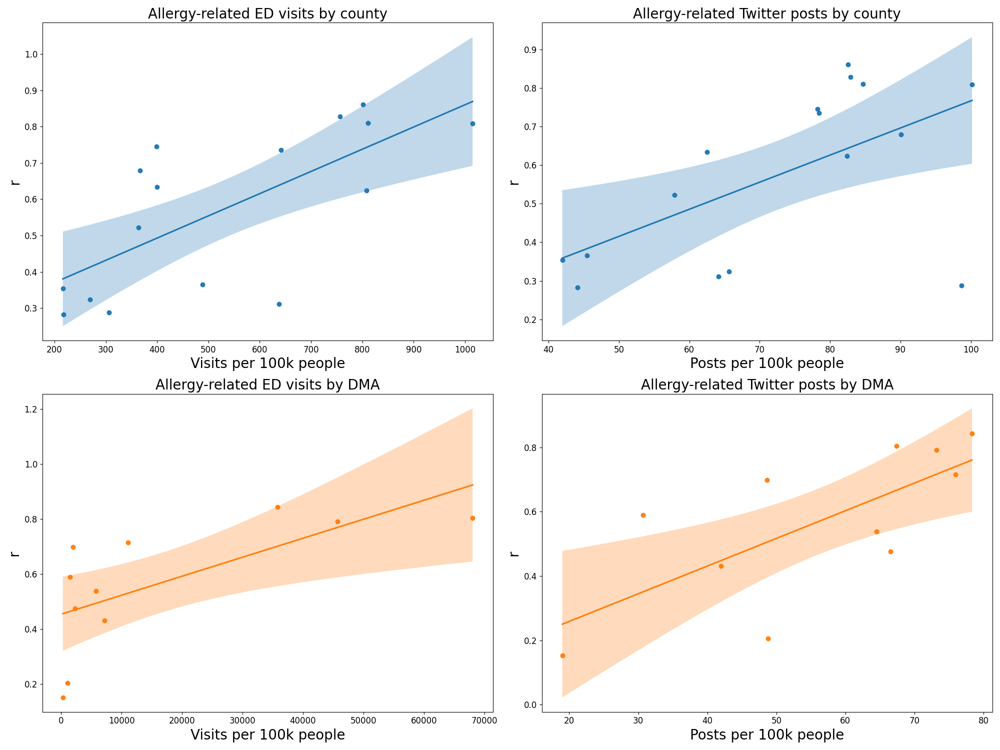

In [40]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize=(20, 15))
fontsize_labels = 20
fontsize_ticks =12

ax1.set_title('Allergy-related ED visits by county', fontsize=fontsize_labels)
res1 = dv.regplot(x="visits_per_100k", y="r", data=p_vs_tweets_twitter, color='tab:blue', ax=ax1)
dv.regplot(x="visits_per_100k", y="r", data=p_vs_tweets_twitter, color='tab:blue', ax=ax1)
ax1.set_xlabel('Visits per 100k people', fontsize=fontsize_labels)
ax1.set_ylabel('r', fontsize=fontsize_labels)
ax1.set_xticklabels(ax1.get_xmajorticklabels(), fontsize=fontsize_ticks)
ax1.set_yticklabels(ax1.get_ymajorticklabels(), fontsize=fontsize_ticks)
#ax1.hlines(0.5, 220, round((0.5 - res1.model.fit().params[0])/res1.model.fit().params[1],0), color ="black", linestyles='dashed')
#ax1.vlines(round((0.5 - res1.model.fit().params[0])/res1.model.fit().params[1],0), .225, 0.5, color ="black", linestyles='dashed')

ax2.set_title('Allergy-related Twitter posts by county', fontsize=fontsize_labels)
res2 = dv.regplot(x="tweets_per_100k", y="r", data=p_vs_tweets_twitter, color='tab:blue', ax=ax2)
dv.regplot(x="tweets_per_100k", y="r", data=p_vs_tweets_twitter, color='tab:blue', ax=ax2)
ax2.set_xlabel('Posts per 100k people', fontsize=fontsize_labels)
ax2.set_ylabel('r', fontsize=fontsize_labels)
ax2.set_xticklabels(ax2.get_xmajorticklabels(), fontsize=fontsize_ticks)
ax2.set_yticklabels(ax2.get_ymajorticklabels(), fontsize=fontsize_ticks)
#ax2.hlines(0.5, 76, round((0.5 - res2.model.fit().params[0])/res2.model.fit().params[1],0), color ="black", linestyles='dashed')
#ax2.vlines(round((0.5 - res2.model.fit().params[0])/res2.model.fit().params[1],0), .225, 0.5, color ="black", linestyles='dashed')

ax3.set_title('Allergy-related ED visits by DMA', fontsize=fontsize_labels)
res3 = dv.regplot(x="visits_per_100k", y="r", data=p_vs_tweets_google, color='tab:orange', ax=ax3)
dv.regplot(x="visits_per_100k", y="r", data=p_vs_tweets_google, color='tab:orange', ax=ax3)
ax3.set_xlabel('Visits per 100k people', fontsize=fontsize_labels)
ax3.set_ylabel('r', fontsize=fontsize_labels)
ax3.set_xticklabels(ax3.get_xmajorticklabels(), fontsize=fontsize_ticks)
ax3.set_yticklabels(ax3.get_ymajorticklabels(), fontsize=fontsize_ticks)
#ax3.hlines(0.5, 192, round((0.5 - res3.model.fit().params[0])/res3.model.fit().params[1],0), color ="black", linestyles='dashed')
#ax3.vlines(round((0.5 - res3.model.fit().params[0])/res3.model.fit().params[1],0), 0.06, 0.5, color ="black", linestyles='dashed')

ax4.set_title('Allergy-related Twitter posts by DMA', fontsize=fontsize_labels)
res4 = dv.regplot(x="tweets_per_100k", y="r", data=p_vs_tweets_google, color='tab:orange', ax=ax4)
dv.regplot(x="tweets_per_100k", y="r", data=p_vs_tweets_google, color='tab:orange', ax=ax4)
ax4.set_xlabel('Posts per 100k people', fontsize=fontsize_labels)
ax4.set_ylabel('r', fontsize=fontsize_labels)
ax4.set_xticklabels(ax4.get_xmajorticklabels(), fontsize=fontsize_ticks)
ax4.set_yticklabels(ax4.get_ymajorticklabels(), fontsize=fontsize_ticks)
#ax4.hlines(0.5, 28, round((0.5 - res4.model.fit().params[0])/res4.model.fit().params[1],0), color ="black", linestyles='dashed')
#ax4.vlines(round((0.5 - res4.model.fit().params[0])/res4.model.fit().params[1],0), -0.175, 0.5, color ="black", linestyles='dashed')

#fig.suptitle('Pearson\'s r vs. Tweet and Diagnosis Frequency', fontsize=20)

plt.tight_layout()
plt.show()

# Figure 3 - Twitter vs Google

#### Comparison of aggregated Twitter volume vs Google search probabilities for each DMA in California. Much like with counties, DMAs with low populations (Eureka, Chico-Redding, Monterey-Salinas, and Santa Barbara-Santa Maria-San Luis Obispo) have low Twitter volume, limiting the usefulness of the comparison. 

In [41]:
# DMAs of interest
dma1 = 802
dma2 = 868
dma3 = 862
dma4 = 807
dma5 = 866
dma6 = 828
dma7 = 855
dma8 = 800
dma9 = 803
dma10 = 825

In [42]:
# Time series for each variable for earch county

dma1_tweet_xt = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma1]['Date']
dma1_tweet_y1 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma1][gsearch_term]
dma1_tweet_y2 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma1]['tweet_count_5dra']

dma2_tweet_xt = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma2]['Date']
dma2_tweet_y1 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma2][gsearch_term]
dma2_tweet_y2 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma2]['tweet_count_5dra']

dma3_tweet_xt = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma3]['Date']
dma3_tweet_y1 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma3][gsearch_term]
dma3_tweet_y2 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma3]['tweet_count_5dra']

dma4_tweet_xt = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma4]['Date']
dma4_tweet_y1 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma4][gsearch_term]
dma4_tweet_y2 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma4]['tweet_count_5dra']

dma5_tweet_xt = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma5]['Date']
dma5_tweet_y1 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma5][gsearch_term]
dma5_tweet_y2 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma5]['tweet_count_5dra']

dma6_tweet_xt = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma6]['Date']
dma6_tweet_y1 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma6][gsearch_term]
dma6_tweet_y2 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma6]['tweet_count_5dra']

dma7_tweet_xt = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma7]['Date']
dma7_tweet_y1 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma7][gsearch_term]
dma7_tweet_y2 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma7]['tweet_count_5dra']

dma8_tweet_xt = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma8]['Date']
dma8_tweet_y1 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma8][gsearch_term]
dma8_tweet_y2 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma8]['tweet_count_5dra']

dma9_tweet_xt = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma9]['Date']
dma9_tweet_y1 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma9][gsearch_term]
dma9_tweet_y2 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma9]['tweet_count_5dra']

dma10_tweet_xt = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma10]['Date']
dma10_tweet_y1 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma10][gsearch_term]
dma10_tweet_y2 = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma10]['tweet_count_5dra']

In [43]:
# Correlations (rho & p values)
# I think we should use rho instead of r here as we're not using a subset of the population of each county, we have all reported diagnoses and all tweets
# rho is rho obviously, p is p, rho_val is rho with *s indicative of p value
# p value is so low that it just displays as zero for most of these, consider just using rho_val
# rho in matplotlib = r"$\rho$"

x = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma1][gsearch_term]
y = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma1]['tweet_count_5dra']
df = pd.DataFrame({'x':x, 'y':y})
rho = df.corr()
pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
rho2 = rho.round(3).astype(str) + p
dma1_tweet_rho_val = rho2['y']['x']
dma1_tweet_rho = rho['x']['y'].round(3)
dma1_tweet_pval = pval['x']['y'].round(3)

x = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma2][gsearch_term]
y = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma2]['tweet_count_5dra']
df = pd.DataFrame({'x':x, 'y':y})
rho = df.corr()
pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
rho2 = rho.round(3).astype(str) + p
dma2_tweet_rho_val = rho2['y']['x']
dma2_tweet_rho = rho['x']['y'].round(3)
dma2_tweet_pval = pval['x']['y'].round(3)

x = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma3][gsearch_term]
y = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma3]['tweet_count_5dra']
df = pd.DataFrame({'x':x, 'y':y})
rho = df.corr()
pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
rho2 = rho.round(3).astype(str) + p
dma3_tweet_rho_val = rho2['y']['x']
dma3_tweet_rho = rho['x']['y'].round(3)
dma3_tweet_pval = pval['x']['y'].round(3)

x = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma4][gsearch_term]
y = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma4]['tweet_count_5dra']
df = pd.DataFrame({'x':x, 'y':y})
rho = df.corr()
pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
rho2 = rho.round(3).astype(str) + p
dma4_tweet_rho_val = rho2['y']['x']
dma4_tweet_rho = rho['x']['y'].round(3)
dma4_tweet_pval = pval['x']['y'].round(3)

x = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma5][gsearch_term]
y = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma5]['tweet_count_5dra']
df = pd.DataFrame({'x':x, 'y':y})
rho = df.corr()
pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
rho2 = rho.round(3).astype(str) + p
dma5_tweet_rho_val = rho2['y']['x']
dma5_tweet_rho = rho['x']['y'].round(3)
dma5_tweet_pval = pval['x']['y'].round(3)

x = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma6][gsearch_term]
y = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma6]['tweet_count_5dra']
df = pd.DataFrame({'x':x, 'y':y})
rho = df.corr()
pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
rho2 = rho.round(3).astype(str) + p
dma6_tweet_rho_val = rho2['y']['x']
dma6_tweet_rho = rho['x']['y'].round(3)
dma6_tweet_pval = pval['x']['y'].round(3)

x = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma7][gsearch_term]
y = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma7]['tweet_count_5dra']
df = pd.DataFrame({'x':x, 'y':y})
rho = df.corr()
pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
rho2 = rho.round(3).astype(str) + p
dma7_tweet_rho_val = rho2['y']['x']
dma7_tweet_rho = rho['x']['y'].round(3)
dma7_tweet_pval = pval['x']['y'].round(3)

x = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma8][gsearch_term]
y = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma8]['tweet_count_5dra']
df = pd.DataFrame({'x':x, 'y':y})
rho = df.corr()
pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
rho2 = rho.round(3).astype(str) + p
dma8_tweet_rho_val = rho2['y']['x']
dma8_tweet_rho = rho['x']['y'].round(3)
dma8_tweet_pval = pval['x']['y'].round(3)

x = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma9][gsearch_term]
y = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma9]['tweet_count_5dra']
df = pd.DataFrame({'x':x, 'y':y})
rho = df.corr()
pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
rho2 = rho.round(3).astype(str) + p
dma9_tweet_rho_val = rho2['y']['x']
dma9_tweet_rho = rho['x']['y'].round(3)
dma9_tweet_pval = pval['x']['y'].round(3)

x = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma10][gsearch_term]
y = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma10]['tweet_count_5dra']
df = pd.DataFrame({'x':x, 'y':y})
rho = df.corr()
pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
rho2 = rho.round(3).astype(str) + p
dma10_tweet_rho_val = rho2['y']['x']
dma10_tweet_rho = rho['x']['y'].round(3)
dma10_tweet_pval = pval['x']['y'].round(3)

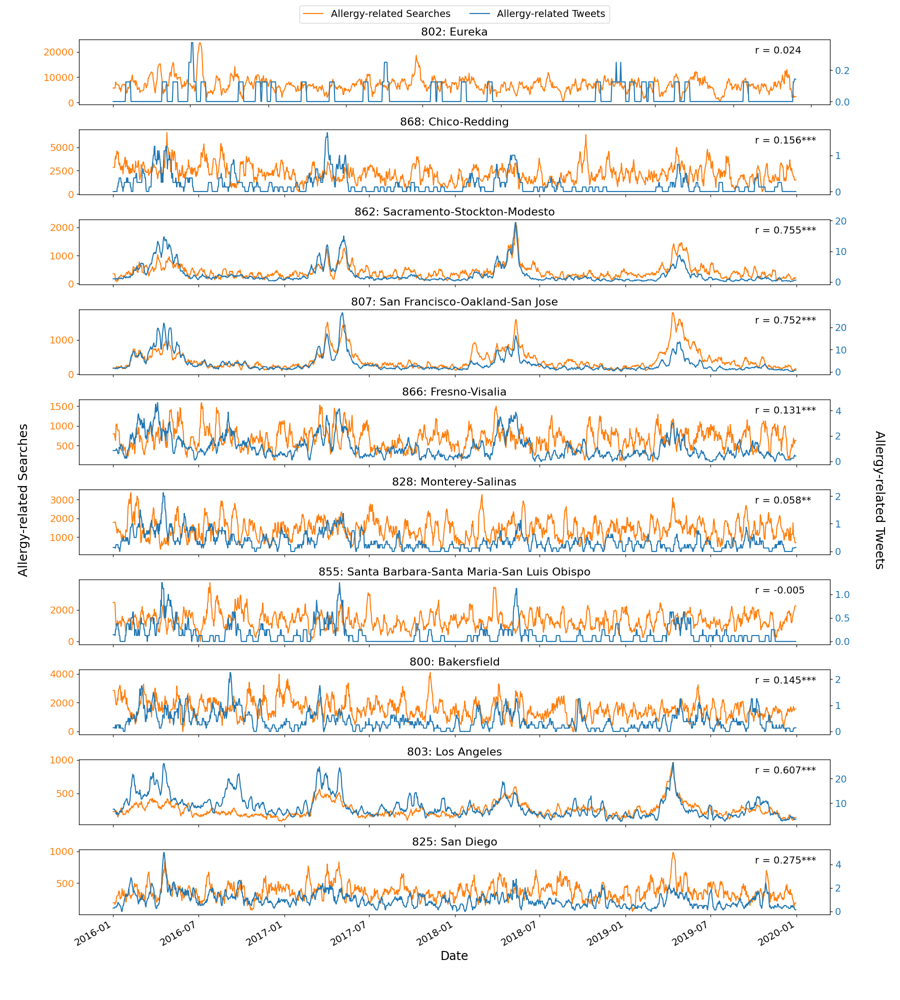

In [44]:
# Name axes
xlabel = 'Date'
ylabel1 = 'Allergy-related Searches'
ylabel2 = 'Allergy-related Tweets'
ylegend1='Allergy-related Searches'
ylegend2='Allergy-related Tweets'


# Create axes
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10) = plt.subplots(10,1, figsize=(18, 20))
fig.text(0.02, 0.5, 'Allergy-related Searches', va='center', rotation=90, fontsize=18)
fig.text(0.97, 0.5, 'Allergy-related Tweets', va='center', rotation=-90, fontsize=18)

ax1.set_title(str(dma1) + ': Eureka', fontsize=16)
ax1, ax1a = two_scales_nolabel(ax1, dma1_tweet_xt, dma1_tweet_y1, dma1_tweet_y2, 'tab:orange', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax1.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax1a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax1.annotate('r' + ' = ' + str(dma1_tweet_rho_val), xy=(.9, .9),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')


ax2.set_title(str(dma2) + ': Chico-Redding', fontsize=16)
ax2, ax2a = two_scales_nolabel(ax2, dma2_tweet_xt, dma2_tweet_y1, dma2_tweet_y2, 'tab:orange', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax2.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax2a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax2.annotate('r' + ' = ' + str(dma2_tweet_rho_val), xy=(.9, .9),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')

ax3.set_title(str(dma3) + ': Sacramento-Stockton-Modesto', fontsize=16)
ax3, ax3a = two_scales_nolabel(ax3, dma3_tweet_xt, dma3_tweet_y1, dma3_tweet_y2, 'tab:orange', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax3.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax3a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax3.annotate('r' + ' = ' + str(dma3_tweet_rho_val), xy=(.9, .9),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')

ax4.set_title(str(dma4) + ': San Francisco-Oakland-San Jose', fontsize=16)
ax4, ax4a = two_scales_nolabel(ax4, dma4_tweet_xt, dma4_tweet_y1, dma4_tweet_y2, 'tab:orange', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax4.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax4a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax4.annotate('r' + ' = ' + str(dma4_tweet_rho_val), xy=(.9, .9),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')

ax5.set_title(str(dma5) + ': Fresno-Visalia', fontsize=16)
ax5, ax5a = two_scales_nolabel(ax5, dma5_tweet_xt, dma5_tweet_y1, dma5_tweet_y2, 'tab:orange', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax5.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax5a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax5.annotate('r' + ' = ' + str(dma5_tweet_rho_val), xy=(.9, .9),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')

ax6.set_title(str(dma6) + ': Monterey-Salinas', fontsize=16)
ax6, ax6a = two_scales_nolabel(ax6, dma6_tweet_xt, dma6_tweet_y1, dma6_tweet_y2, 'tab:orange', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax6.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax6a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax6.annotate('r' + ' = ' + str(dma6_tweet_rho_val), xy=(.9, .9),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')

ax7.set_title(str(dma7) + ': Santa Barbara-Santa Maria-San Luis Obispo', fontsize=16)
ax7, ax7a = two_scales_nolabel(ax7, dma7_tweet_xt, dma7_tweet_y1, dma7_tweet_y2, 'tab:orange', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax7.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax7a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax7.annotate('r' + ' = ' + str(dma7_tweet_rho_val), xy=(.9, .9),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')

ax8.set_title(str(dma8) + ': Bakersfield', fontsize=16)
ax8, ax8a = two_scales_nolabel(ax8, dma8_tweet_xt, dma8_tweet_y1, dma8_tweet_y2, 'tab:orange', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax8.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax8a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax8.annotate('r' + ' = ' + str(dma8_tweet_rho_val), xy=(.9, .9),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')

ax9.set_title(str(dma9) + ': Los Angeles', fontsize=16)
ax9, ax9a = two_scales_nolabel(ax9, dma9_tweet_xt, dma9_tweet_y1, dma9_tweet_y2, 'tab:orange', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax9.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax9a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax9.annotate('r' + ' = ' + str(dma9_tweet_rho_val), xy=(.9, .9),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')

ax10.set_title(str(dma10) + ': San Diego', fontsize=16)
ax10, ax10a = two_scales_nolabel(ax10, dma10_tweet_xt, dma10_tweet_y1, dma10_tweet_y2, 'tab:orange', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax10.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax10a.tick_params(axis='both', which='major', labelsize=14, grid_alpha=0)
ax10.annotate('r' + ' = ' + str(dma10_tweet_rho_val), xy=(.9, .9),xycoords='axes fraction', fontsize=14, horizontalalignment='left', verticalalignment='top')




color_y_axis(ax1, 'tab:orange')
color_y_axis(ax1a, 'tab:blue')
color_y_axis(ax2, 'tab:orange')
color_y_axis(ax2a, 'tab:blue')
color_y_axis(ax3, 'tab:orange')
color_y_axis(ax3a, 'tab:blue')
color_y_axis(ax4, 'tab:orange')
color_y_axis(ax4a, 'tab:blue')
color_y_axis(ax5, 'tab:orange')
color_y_axis(ax5a, 'tab:blue')
color_y_axis(ax6, 'tab:orange')
color_y_axis(ax6a, 'tab:blue')
color_y_axis(ax7, 'tab:orange')
color_y_axis(ax7a, 'tab:blue')
color_y_axis(ax8, 'tab:orange')
color_y_axis(ax8a, 'tab:blue')
color_y_axis(ax9, 'tab:orange')
color_y_axis(ax9a, 'tab:blue')
color_y_axis(ax10, 'tab:orange')
color_y_axis(ax10a, 'tab:blue')



handles, labels = ax1.get_legend_handles_labels()
handles2, labels2 = ax1a.get_legend_handles_labels()


#fig.suptitle("Allergy-related Searches vs Tweets, 7-day Rolling Average", fontsize=20)
fig.autofmt_xdate()

plt.tight_layout(rect=[0.04, 0.03, .96, .98])
#plt.tight_layout(rect=[0, 0.03, 1, 0.97])
ax1.legend(handles + handles2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, 1.6), ncol=2, fontsize=14)
plt.show()

## Fig 4: National Allergies

In [45]:
monthly = all_roll_avgs_short
monthly_tweets = monthly[['Date','county_name','tweet_count']]
monthly_tweets.head()

,Date,county_name,tweet_count
0,2016-01-01,Los Angeles,6
1,2016-01-02,Los Angeles,6
2,2016-01-03,Los Angeles,8
3,2016-01-04,Los Angeles,1
4,2016-01-05,Los Angeles,7


In [46]:
monthly_tweets['Date'] = pd.to_datetime(monthly_tweets['Date'])

In [47]:
monthly_tweets['week_year'] = monthly_tweets['Date'].dt.strftime('%Y-%U')
monthly_tweets.head(2)

,Date,county_name,tweet_count,week_year
0,2016-01-01,Los Angeles,6,2016-00
1,2016-01-02,Los Angeles,6,2016-00


In [48]:
#monthly_sum_df = monthly_tweets.groupby(['county_name','month_year']).agg({'tweet_count': 'sum'})
monthly_sum_df = monthly_tweets.groupby(['county_name','week_year']).agg({'tweet_count': 'sum'})
monthly_sum_df.reset_index(inplace=True)
monthly_sum_df = pd.merge(monthly_sum_df,countypop[['county_name','Population']], how='left', on='county_name')
monthly_sum_df['Population'] = monthly_sum_df['Population']/100000
monthly_sum_df['tweet_count_per_100k'] = monthly_sum_df['tweet_count']/monthly_sum_df['Population']

#monthly_sum_df['tweet_count_per_100k'] = monthly_sum_df['tweet_count']
monthly_sum_df.drop(['Population','tweet_count'], axis=1, inplace=True)

In [49]:
#monthly_grid = pd.pivot(monthly_sum_df,index='county_name',columns='month_year',values='tweet_count_per_100k')
monthly_grid = pd.pivot(monthly_sum_df,index='county_name',columns='week_year',values='tweet_count_per_100k')
monthly_grid = monthly_grid.div(monthly_grid.sum(axis=1), axis=0)

cn = ['Alameda','Contra Costa','Fresno','Kern','Los Angeles','Orange','Riverside','Sacramento','San Bernardino','San Diego','San Francisco','San Joaquin','San Mateo','Santa Clara','Stanislaus','Ventura']
ns = [4,3,9,10,13,15,14,1,12,16,5,2,7,8,6,11]
part = ['north','north','north','south','south','south','south','north','south','south','north','north','north','north','north','south']
northsouth = pd.DataFrame([cn, ns, part]).T
northsouth.columns = ['county_name', 'ns','part']
northsouth
#ns = pd.DataFrame([[cn,ns,part]],columns=['county_name','ns','part'])
#ns
#admits_visits_joined_4 = pd.merge(admits_visits_joined_4,countypop, how='left', on='county_name')

monthly_grid = pd.merge(monthly_grid,northsouth[['county_name','ns']], how='left', on='county_name')
monthly_grid = monthly_grid.sort_values('ns')
monthly_grid.drop('ns', axis=1, inplace=True)
monthly_grid.set_index('county_name', inplace=True)


In [50]:
#### Divide by column sum AND row to get
from sklearn.preprocessing import MinMaxScaler
monthly_grid_scaled = monthly_grid.copy()
scaler = 1/(monthly_grid.to_numpy().max())

monthly_grid_scaled = monthly_grid_scaled.apply(lambda x : x * scaler)

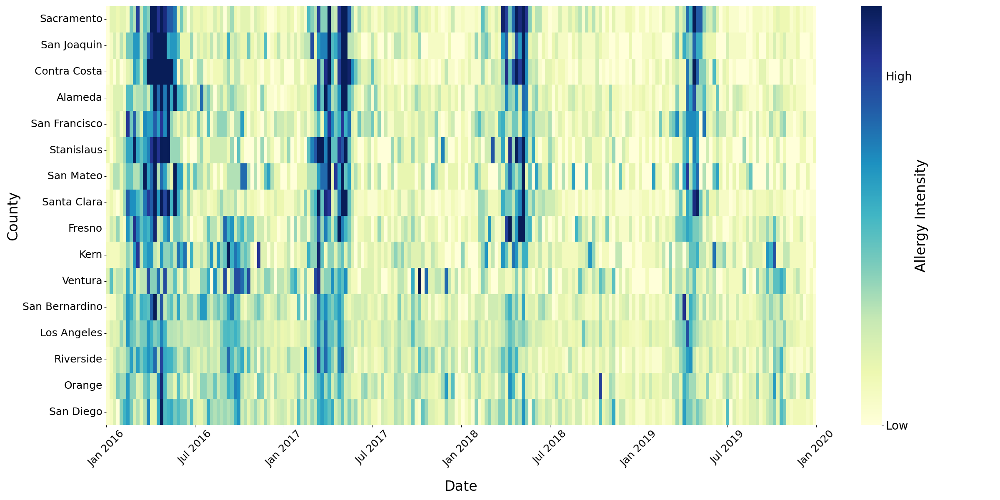

In [51]:
fig, ax = plt.subplots(figsize=(24, 12))    
sns.heatmap(monthly_grid, robust=True, cmap='YlGnBu', yticklabels=True, xticklabels=10, cbar=True, cbar_kws={"ticks":[0,0.01651]})
ax.set_xticks([0, 
               len(monthly_grid.columns)/8, 
               len(monthly_grid.columns)/8*2, 
               len(monthly_grid.columns)/8*3, 
               len(monthly_grid.columns)/8*4, 
               len(monthly_grid.columns)/8*5, 
               len(monthly_grid.columns)/8*6, 
               len(monthly_grid.columns)/8*7, 
               len(monthly_grid.columns)/8*8])
#ax.set_title('Weekly Allergy Intensity, 2016-2019', pad=20, fontsize = 30)
ax.tick_params(axis='both', which='major', pad=3)
ax.set_xticklabels(["Jan 2016", "Jul 2016", "Jan 2017", "Jul 2017", "Jan 2018", "Jul 2018", "Jan 2019", "Jul 2019", "Jan 2020"], fontsize = 12)
plt.xticks(rotation=45, fontsize = 18)
plt.yticks(fontsize = 18)
plt.xlabel("Date", fontsize = 24, labelpad=20)
plt.ylabel("County", fontsize = 24)
plt.rcParams["figure.figsize"] = [7.50, 3.50]

ax.collections[0].colorbar.set_ticklabels(["Low","High"], fontsize = 20)
ax.collections[0].colorbar.set_label("Allergy Intensity",fontsize = 24)

ax.margins(x=0)
plt.tight_layout()


image_format = 'svg' # e.g .png, .svg, etc.
image_name = 'cali_weekly.svg'

plt.savefig(image_name, format=image_format, dpi=300)


plt.show()

In [52]:
x = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma7][gsearch_term]
y = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == dma7]['tweet_count_5dra']
df = pd.DataFrame({'x':x, 'y':y})

# Supplimental Figures

## Supplimental Fig. 2, STL Residuals

In [53]:
# Counties of interest

ct1 = 'Los Angeles'
ct2 = 'San Diego'
ct3 = 'Orange'
ct4 = 'Riverside'
ct5 = 'San Bernardino'
ct6 = 'Santa Clara'
ct7 = 'Alameda'
ct8 = 'Sacramento'
ct9 = 'Contra Costa'
ct10 = 'Fresno'
ct11 = 'Kern'
ct12 = 'Ventura'
ct13 = 'San Francisco'
ct14 = 'San Joaquin'
ct15 = 'San Mateo'
ct16 = 'Stanislaus'

In [54]:
all_roll_avgs_over_5k_bk = all_roll_avgs_short

In [55]:
all_roll_avgs_short['tweet_count_7dra'] = all_roll_avgs_short['tweet_count_7dra']*1000
#all_roll_avgs_over_5k

In [56]:
#all_roll_avgs_over_5k[all_roll_avgs_over_5k.isnull().any(axis=1)]

In [57]:
def calculate_stl_and_corr(data, county_name, column1, column2, period, seasonal):
    stl_v = STL(data.loc[data['county_name'] == county_name][column1], period=period, seasonal=seasonal, seasonal_deg=0, trend_deg=0, low_pass_deg=0, robust=0)
    stl_v_r = stl_v.fit().resid.values
    
    stl_t = STL(data.loc[data['county_name'] == county_name][column2], period=period, seasonal=seasonal, seasonal_deg=0, trend_deg=0, low_pass_deg=0, robust=0)
    stl_t_r = stl_t.fit().resid.values
    
    df = pd.DataFrame({'x': stl_v_r, 'y': stl_t_r})
    rho = df.corr()
    pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
    p = pval.applymap(lambda x: ''.join(['*' for t in [0.01, 0.05, 0.1] if x <= t]))
    rho2 = rho.round(3).astype(str) + p
    stl_rho_val = rho2['y']['x']
    
    return stl_rho_val, stl_v_r, stl_t_r

# Applying the function for each county
stl_rho_val_1, stl_v_1_r, stl_t_1_r = calculate_stl_and_corr(all_roll_avgs_short, ct1, 'v_allergy_cols_7dra', 'tweet_count_7dra', 366, 365)
stl_rho_val_2, stl_v_2_r, stl_t_2_r = calculate_stl_and_corr(all_roll_avgs_short, ct2, 'v_allergy_cols_7dra', 'tweet_count_7dra', 366, 365)
stl_rho_val_3, stl_v_3_r, stl_t_3_r = calculate_stl_and_corr(all_roll_avgs_short, ct3, 'v_allergy_cols_7dra', 'tweet_count_7dra', 366, 365)
stl_rho_val_4, stl_v_4_r, stl_t_4_r = calculate_stl_and_corr(all_roll_avgs_short, ct4, 'v_allergy_cols_7dra', 'tweet_count_7dra', 366, 365)
stl_rho_val_5, stl_v_5_r, stl_t_5_r = calculate_stl_and_corr(all_roll_avgs_short, ct5, 'v_allergy_cols_7dra', 'tweet_count_7dra', 366, 365)
stl_rho_val_6, stl_v_6_r, stl_t_6_r = calculate_stl_and_corr(all_roll_avgs_short, ct6, 'v_allergy_cols_7dra', 'tweet_count_7dra', 366, 365)
stl_rho_val_7, stl_v_7_r, stl_t_7_r = calculate_stl_and_corr(all_roll_avgs_short, ct7, 'v_allergy_cols_7dra', 'tweet_count_7dra', 366, 365)
stl_rho_val_8, stl_v_8_r, stl_t_8_r = calculate_stl_and_corr(all_roll_avgs_short, ct8, 'v_allergy_cols_7dra', 'tweet_count_7dra', 366, 365)
stl_rho_val_9, stl_v_9_r, stl_t_9_r = calculate_stl_and_corr(all_roll_avgs_short, ct9, 'v_allergy_cols_7dra', 'tweet_count_7dra', 366, 365)
stl_rho_val_10, stl_v_10_r, stl_t_10_r = calculate_stl_and_corr(all_roll_avgs_short, ct10, 'v_allergy_cols_7dra', 'tweet_count_7dra', 366, 365)
stl_rho_val_11, stl_v_11_r, stl_t_11_r = calculate_stl_and_corr(all_roll_avgs_short, ct11, 'v_allergy_cols_7dra', 'tweet_count_7dra', 366, 365)
stl_rho_val_12, stl_v_12_r, stl_t_12_r = calculate_stl_and_corr(all_roll_avgs_short, ct12, 'v_allergy_cols_7dra', 'tweet_count_7dra', 366, 365)
stl_rho_val_13, stl_v_13_r, stl_t_13_r = calculate_stl_and_corr(all_roll_avgs_short, ct13, 'v_allergy_cols_7dra', 'tweet_count_7dra', 366, 365)
stl_rho_val_14, stl_v_14_r, stl_t_14_r = calculate_stl_and_corr(all_roll_avgs_short, ct14, 'v_allergy_cols_7dra', 'tweet_count_7dra', 366, 365)
stl_rho_val_15, stl_v_15_r, stl_t_15_r = calculate_stl_and_corr(all_roll_avgs_short, ct15, 'v_allergy_cols_7dra', 'tweet_count_7dra', 366, 365)
stl_rho_val_16, stl_v_16_r, stl_t_16_r = calculate_stl_and_corr(all_roll_avgs_short, ct16, 'v_allergy_cols_7dra', 'tweet_count_7dra', 366, 365)


In [58]:
def two_scales_nolabel(ax1, time, data1, data2, c1, c2, xlabel, ylabel1, ylabel2, ylegend1, ylegend2):
    ax2 = ax1.twinx()
    ax1.plot(time, data1, color=c1, label=ylegend1)
    ax1.set_xlabel(xlabel, fontsize=17)
    #ax1.set_ylabel(ylabel1, fontsize=17)
    ax2.plot(time, data2, color=c2, label=ylegend2)
    #ax2.set_ylabel(ylabel2, fontsize=17)
    return ax1, ax2

In [59]:
def align_yaxis(ax1, v1, ax2, v2):
    """adjust ax2 ylimit so that v2 in ax2 is aligned to v1 in ax1"""
    _, y1 = ax1.transData.transform((0, v1))
    _, y2 = ax2.transData.transform((0, v2))
    inv = ax2.transData.inverted()
    _, dy = inv.transform((0, 0)) - inv.transform((0, y1-y2))
    miny, maxy = ax2.get_ylim()
    ax2.set_ylim(miny+dy, maxy+dy)

In [60]:
try:
    import mpl_axes_aligner
except:
    !pip install mpl-axes-aligner
    import mpl_axes_aligner

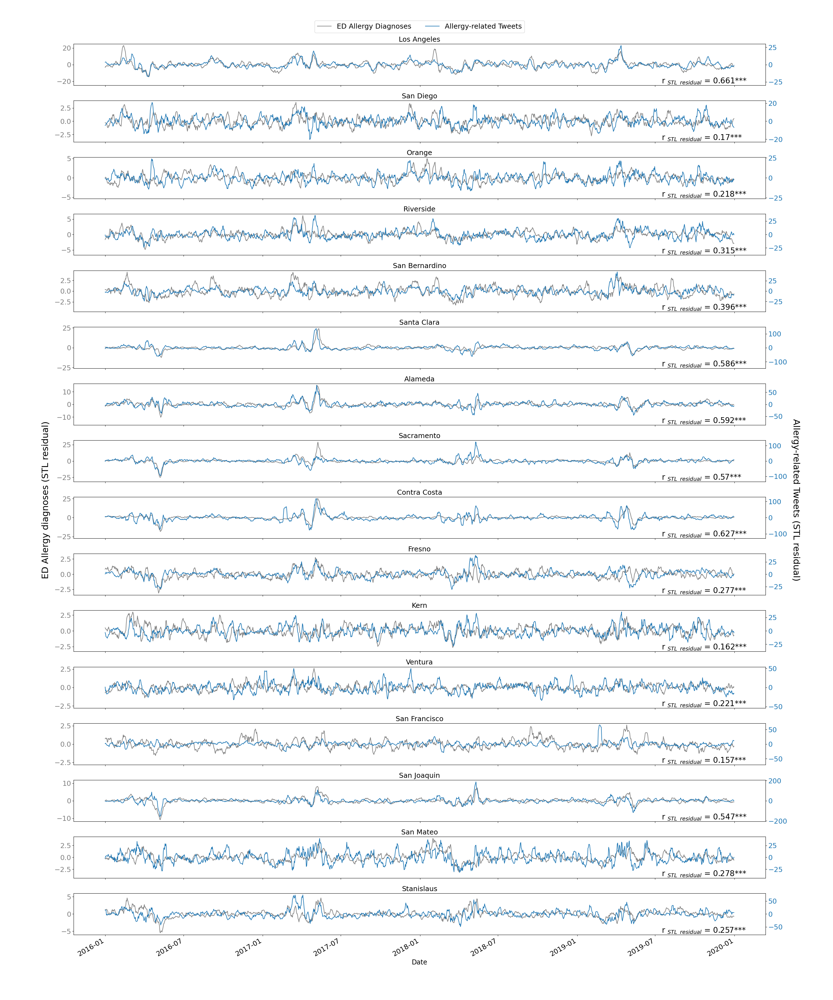

In [61]:
# Name axes
xlabel='Date'
ylabel1='ED Allergy Diagnoses'
ylabel2='Allergy-related Tweets'
ylegend1='ED Allergy Diagnoses'
ylegend2='Allergy-related Tweets'

fontsize_text = 23
fontsize_labels = 18
fontsize_annotations = 20
fontsize_titles = 18
fontsize_legend = 18
fontsize_suptitle = 35

# Create axes
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12, ax13, ax14, ax15, ax16) = plt.subplots(16,1, figsize=(30, 36))
fig.text(0.05, 0.5, 'ED Allergy diagnoses (STL residual)', va='center', rotation=90, fontsize=fontsize_text)
fig.text(0.95, 0.5, 'Allergy-related Tweets (STL residual)', va='center', rotation=-90, fontsize=fontsize_text)
#fig.text(0.5, 0.0, 'Allergy-related Tweets (STL residual)', va='center', rotation=0, fontsize=18)

ax1.set_title(str(ct1), fontsize=fontsize_titles)
ax1, ax1a = two_scales_nolabel(ax1, ct1_xt, stl_v_1_r, stl_t_1_r, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax1.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax1a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax1.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(stl_rho_val_1), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax1, 0, ax1a, 0, 0.5)
ax1.grid(False)
ax1a.grid(False)

ax2.set_title(str(ct2), fontsize=fontsize_titles)
ax2, ax2a = two_scales_nolabel(ax2, ct1_xt, stl_v_2_r, stl_t_2_r, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax2.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax2a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax2.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(stl_rho_val_2), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax2, 0, ax2a, 0, 0.5)
ax2.grid(False)
ax2a.grid(False)

ax3.set_title(str(ct3), fontsize=fontsize_titles)
ax3, ax3a = two_scales_nolabel(ax3, ct1_xt, stl_v_3_r, stl_t_3_r, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax3.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax3a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax3.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(stl_rho_val_3), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax3, 0, ax3a, 0, 0.5)
ax3.grid(False)
ax3a.grid(False)

ax4.set_title(str(ct4), fontsize=fontsize_titles)
ax4, ax4a = two_scales_nolabel(ax4, ct1_xt, stl_v_4_r, stl_t_4_r, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax4.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax4a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax4.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(stl_rho_val_4), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax4, 0, ax4a, 0, 0.5)
ax4.grid(False)
ax4a.grid(False)

ax5.set_title(str(ct5), fontsize=fontsize_titles)
ax5, ax5a = two_scales_nolabel(ax5, ct1_xt, stl_v_5_r, stl_t_5_r, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax5.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax5a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax5.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(stl_rho_val_5), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax5, 0, ax5a, 0, 0.5)
ax5.grid(False)
ax5a.grid(False)

ax6.set_title(str(ct6), fontsize=fontsize_titles)
ax6, ax6a = two_scales_nolabel(ax6, ct1_xt, stl_v_6_r, stl_t_6_r, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax6.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax6a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax6.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(stl_rho_val_6), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax6, 0, ax6a, 0, 0.5)
ax6.grid(False)
ax6a.grid(False)

ax7.set_title(str(ct7), fontsize=fontsize_titles)
ax7, ax7a = two_scales_nolabel(ax7, ct1_xt, stl_v_7_r, stl_t_7_r, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax7.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax7a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax7.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(stl_rho_val_7), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax7, 0, ax7a, 0, 0.5)
ax7.grid(False)
ax7a.grid(False)

ax8.set_title(str(ct8), fontsize=fontsize_titles)
ax8, ax8a = two_scales_nolabel(ax8, ct1_xt, stl_v_8_r, stl_t_8_r, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax8.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax8a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax8.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(stl_rho_val_8), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax8, 0, ax8a, 0, 0.5)
ax8.grid(False)
ax8a.grid(False)

ax9.set_title(str(ct9), fontsize=fontsize_titles)
ax9, ax9a = two_scales_nolabel(ax9, ct1_xt, stl_v_9_r, stl_t_9_r, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax9.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax9a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax9.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(stl_rho_val_9), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax9, 0, ax9a, 0, 0.5)
ax9.grid(False)
ax9a.grid(False)

ax10.set_title(str(ct10), fontsize=fontsize_titles)
ax10, ax10a = two_scales_nolabel(ax10, ct1_xt, stl_v_10_r, stl_t_10_r, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax10.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax10a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax10.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(stl_rho_val_10), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax10, 0, ax10a, 0, 0.5)
ax10.grid(False)
ax10a.grid(False)

ax11.set_title(str(ct11), fontsize=fontsize_titles)
ax11, ax11a = two_scales_nolabel(ax11, ct1_xt, stl_v_11_r, stl_t_11_r, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax11.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax11a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax11.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(stl_rho_val_11), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax11, 0, ax11a, 0, 0.5)
ax11.grid(False)
ax11a.grid(False)

ax12.set_title(str(ct12), fontsize=fontsize_titles)
ax12, ax12a = two_scales_nolabel(ax12, ct1_xt, stl_v_12_r, stl_t_12_r, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax12.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax12a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax12.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(stl_rho_val_12), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax12, 0, ax12a, 0, 0.5)
ax12.grid(False)
ax12a.grid(False)

ax13.set_title(str(ct13), fontsize=fontsize_titles)
ax13, ax13a = two_scales_nolabel(ax13, ct1_xt, stl_v_13_r, stl_t_13_r, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax13.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax13a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax13.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(stl_rho_val_13), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax13, 0, ax13a, 0, 0.5)
ax13.grid(False)
ax13a.grid(False)

ax14.set_title(str(ct14), fontsize=fontsize_titles)
ax14, ax14a = two_scales_nolabel(ax14, ct1_xt, stl_v_14_r, stl_t_14_r, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax14.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax14a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax14.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(stl_rho_val_14), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax14, 0, ax14a, 0, 0.5)
ax14.grid(False)
ax14a.grid(False)

ax15.set_title(str(ct15), fontsize=fontsize_titles)
ax15, ax15a = two_scales_nolabel(ax15, ct1_xt, stl_v_15_r, stl_t_15_r, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax15.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax15a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax15.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(stl_rho_val_15), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax15, 0, ax15a, 0, 0.5)
ax15.grid(False)
ax15a.grid(False)

ax16.set_title(str(ct16), fontsize=fontsize_titles)
ax16, ax16a = two_scales_nolabel(ax16, ct1_xt, stl_v_16_r, stl_t_16_r, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax16.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax16a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax16.annotate('r ' + '$_{STL}$' + ' ' + '$_{residual}$' + ' = ' + str(stl_rho_val_16), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax16, 0, ax16a, 0, 0.5)
ax16.grid(False)
ax16a.grid(False)

color_y_axis(ax1, 'tab:grey')
color_y_axis(ax1a, 'tab:blue')
color_y_axis(ax2, 'tab:grey')
color_y_axis(ax2a, 'tab:blue')
color_y_axis(ax3, 'tab:grey')
color_y_axis(ax3a, 'tab:blue')
color_y_axis(ax4, 'tab:grey')
color_y_axis(ax4a, 'tab:blue')
color_y_axis(ax5, 'tab:grey')
color_y_axis(ax5a, 'tab:blue')
color_y_axis(ax6, 'tab:grey')
color_y_axis(ax6a, 'tab:blue')
color_y_axis(ax7, 'tab:grey')
color_y_axis(ax7a, 'tab:blue')
color_y_axis(ax8, 'tab:grey')
color_y_axis(ax8a, 'tab:blue')
color_y_axis(ax9, 'tab:grey')
color_y_axis(ax9a, 'tab:blue')
color_y_axis(ax10, 'tab:grey')
color_y_axis(ax10a, 'tab:blue')
color_y_axis(ax11, 'tab:grey')
color_y_axis(ax11a, 'tab:blue')
color_y_axis(ax12, 'tab:grey')
color_y_axis(ax12a, 'tab:blue')
color_y_axis(ax13, 'tab:grey')
color_y_axis(ax13a, 'tab:blue')
color_y_axis(ax14, 'tab:grey')
color_y_axis(ax14a, 'tab:blue')
color_y_axis(ax15, 'tab:grey')
color_y_axis(ax15a, 'tab:blue')
color_y_axis(ax16, 'tab:grey')
color_y_axis(ax16a, 'tab:blue')


#fig.suptitle("ED Allergy Diagnoses vs Allergy-related Tweets, STL Residuals", fontsize=20)
fig.autofmt_xdate()

handles, labels = ax1.get_legend_handles_labels()
handles2, labels2 = ax1a.get_legend_handles_labels()
ax1.legend(handles + handles2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, 1.65), ncol=3, fontsize=fontsize_legend)

plt.tight_layout(rect=[0.06, 0.03, .95, .98])


plt.show()

## Supplimental Fig. 3, OLS Residuals

In [62]:
# Counties of interest

ct1 = 'Los Angeles'
ct2 = 'San Diego'
ct3 = 'Orange'
ct4 = 'Riverside'
ct5 = 'San Bernardino'
ct6 = 'Santa Clara'
ct7 = 'Alameda'
ct8 = 'Sacramento'
ct9 = 'Contra Costa'
ct10 = 'Fresno'
ct11 = 'Kern'
ct12 = 'Ventura'
ct13 = 'San Francisco'
ct14 = 'San Joaquin'
ct15 = 'San Mateo'
ct16 = 'Stanislaus'

In [63]:
def calculate_ols_and_corr(data, county_name, column1, column2):
    ols_test = data.loc[data['county_name'] == county_name]
    ols_endog_y1 = ols_test[column1]
    ols_endog_y2 = ols_test[column2]
    ols_exog = ols_test[['Date', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']]
    ols_exog['Date'] = ols_exog['Date'].apply(lambda x: x.toordinal())
    ols_exog['Date'] = ols_exog['Date'].apply(lambda x: x - 735963)
    ols_matrix = pd.concat([ols_endog_y1, ols_endog_y2, ols_exog], axis=1)
    ols_result_y1 = sm.OLS(ols_matrix[column1], ols_matrix[['Date', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']]).fit()
    ols_result_y2 = sm.OLS(ols_matrix[column2], ols_matrix[['Date', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']]).fit()
    y1resid = ols_result_y1.resid
    y2resid = ols_result_y2.resid
    df = pd.DataFrame({'x': y1resid, 'y': y2resid})
    rho = df.corr()
    pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
    p = pval.applymap(lambda x: ''.join(['*' for t in [0.01, 0.05, 0.1] if x <= t]))
    rho2 = rho.round(3).astype(str) + p
    ols_rho_val = rho2['y']['x']
    
    return ols_rho_val, y1resid, y2resid

# Applying the function for each county
ct1_ols_rho_val, y1resid_1, y2resid_1 = calculate_ols_and_corr(all_roll_avgs_short, ct1, 'v_allergy_cols_7dra', 'tweet_count_7dra')
ct2_ols_rho_val, y1resid_2, y2resid_2 = calculate_ols_and_corr(all_roll_avgs_short, ct2, 'v_allergy_cols_7dra', 'tweet_count_7dra')
ct3_ols_rho_val, y1resid_3, y2resid_3 = calculate_ols_and_corr(all_roll_avgs_short, ct3, 'v_allergy_cols_7dra', 'tweet_count_7dra')
ct4_ols_rho_val, y1resid_4, y2resid_4 = calculate_ols_and_corr(all_roll_avgs_short, ct4, 'v_allergy_cols_7dra', 'tweet_count_7dra')
ct5_ols_rho_val, y1resid_5, y2resid_5 = calculate_ols_and_corr(all_roll_avgs_short, ct5, 'v_allergy_cols_7dra', 'tweet_count_7dra')
ct6_ols_rho_val, y1resid_6, y2resid_6 = calculate_ols_and_corr(all_roll_avgs_short, ct6, 'v_allergy_cols_7dra', 'tweet_count_7dra')
ct7_ols_rho_val, y1resid_7, y2resid_7 = calculate_ols_and_corr(all_roll_avgs_short, ct7, 'v_allergy_cols_7dra', 'tweet_count_7dra')
ct8_ols_rho_val, y1resid_8, y2resid_8 = calculate_ols_and_corr(all_roll_avgs_short, ct8, 'v_allergy_cols_7dra', 'tweet_count_7dra')
ct9_ols_rho_val, y1resid_9, y2resid_9 = calculate_ols_and_corr(all_roll_avgs_short, ct9, 'v_allergy_cols_7dra', 'tweet_count_7dra')
ct10_ols_rho_val, y1resid_10, y2resid_10 = calculate_ols_and_corr(all_roll_avgs_short, ct10, 'v_allergy_cols_7dra', 'tweet_count_7dra')
ct11_ols_rho_val, y1resid_11, y2resid_11 = calculate_ols_and_corr(all_roll_avgs_short, ct11, 'v_allergy_cols_7dra', 'tweet_count_7dra')
ct12_ols_rho_val, y1resid_12, y2resid_12 = calculate_ols_and_corr(all_roll_avgs_short, ct12, 'v_allergy_cols_7dra', 'tweet_count_7dra')
ct13_ols_rho_val, y1resid_13, y2resid_13 = calculate_ols_and_corr(all_roll_avgs_short, ct13, 'v_allergy_cols_7dra', 'tweet_count_7dra')
ct14_ols_rho_val, y1resid_14, y2resid_14 = calculate_ols_and_corr(all_roll_avgs_short, ct14, 'v_allergy_cols_7dra', 'tweet_count_7dra')
ct15_ols_rho_val, y1resid_15, y2resid_15 = calculate_ols_and_corr(all_roll_avgs_short, ct15, 'v_allergy_cols_7dra', 'tweet_count_7dra')
ct16_ols_rho_val, y1resid_16, y2resid_16 = calculate_ols_and_corr(all_roll_avgs_short, ct16, 'v_allergy_cols_7dra', 'tweet_count_7dra')


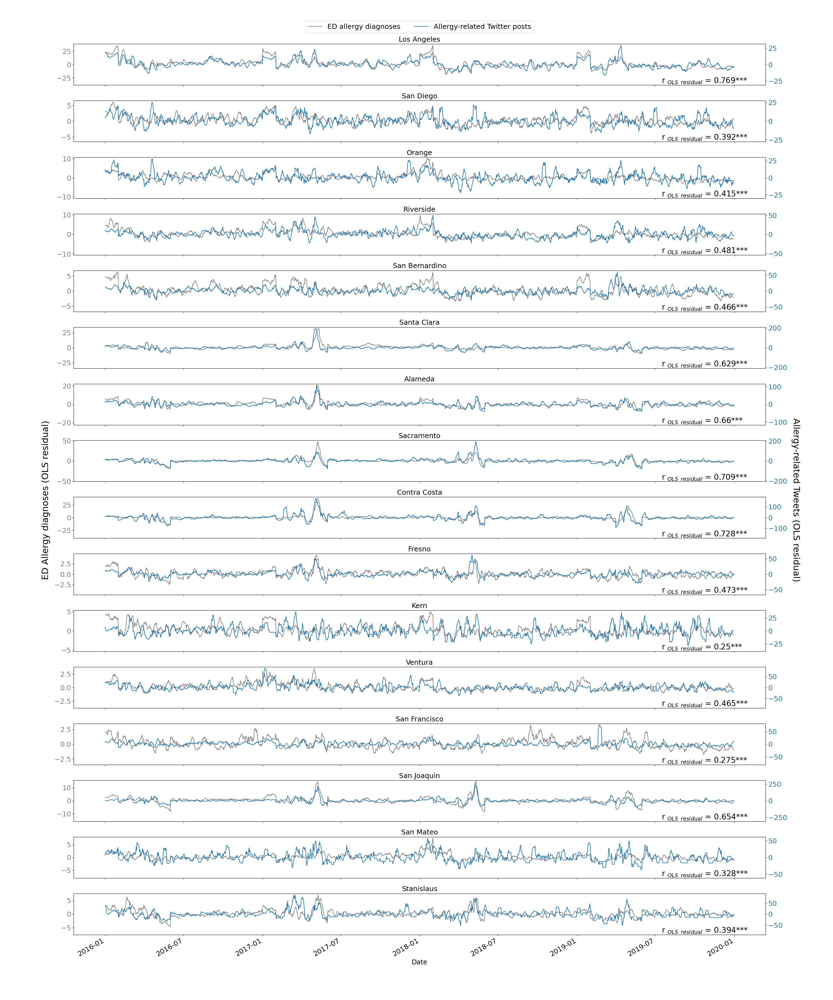

In [64]:
# Name axes
xlabel='Date'
ylabel1='ED allergy diagnoses'
ylabel2='Allergy-related Twitter posts'
ylegend1='ED allergy diagnoses'
ylegend2='Allergy-related Twitter posts'

fontsize_text = 23
fontsize_labels = 18
fontsize_annotations = 20
fontsize_titles = 18
fontsize_legend = 18
fontsize_suptitle = 35

# Create axes
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12, ax13, ax14, ax15, ax16) = plt.subplots(16,1, figsize=(30, 36))
fig.text(0.05, 0.5, 'ED Allergy diagnoses (OLS residual)', va='center', rotation=90, fontsize=fontsize_text)
fig.text(0.95, 0.5, 'Allergy-related Tweets (OLS residual)', va='center', rotation=-90, fontsize=fontsize_text)
#fig.text(0.5, 0.0, 'Allergy-related Tweets (STL residual)', va='center', rotation=0, fontsize=18)

ax1.set_title(str(ct1), fontsize=fontsize_titles)
ax1, ax1a = two_scales_nolabel(ax1, ct1_xt, y1resid_1, y2resid_1, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax1.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax1a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax1.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct1_ols_rho_val), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax1, 0, ax1a, 0, 0.5)
ax1.grid(False)
ax1a.grid(False)

ax2.set_title(str(ct2), fontsize=fontsize_titles)
ax2, ax2a = two_scales_nolabel(ax2, ct1_xt, y1resid_2, y2resid_2, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax2.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax2a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax2.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct2_ols_rho_val), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax2, 0, ax2a, 0, 0.5)
ax2.grid(False)
ax2a.grid(False)

ax3.set_title(str(ct3), fontsize=fontsize_titles)
ax3, ax3a = two_scales_nolabel(ax3, ct1_xt, y1resid_3, y2resid_3, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax3.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax3a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax3.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct3_ols_rho_val), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax3, 0, ax3a, 0, 0.5)
ax3.grid(False)
ax3a.grid(False)

ax4.set_title(str(ct4), fontsize=fontsize_titles)
ax4, ax4a = two_scales_nolabel(ax4, ct1_xt, y1resid_4, y2resid_4, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax4.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax4a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax4.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct4_ols_rho_val), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax4, 0, ax4a, 0, 0.5)
ax4.grid(False)
ax4a.grid(False)

ax5.set_title(str(ct5), fontsize=fontsize_titles)
ax5, ax5a = two_scales_nolabel(ax5, ct1_xt, y1resid_5, y2resid_5, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax5.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax5a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax5.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct5_ols_rho_val), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax5, 0, ax5a, 0, 0.5)
ax5.grid(False)
ax5a.grid(False)

ax6.set_title(str(ct6), fontsize=fontsize_titles)
ax6, ax6a = two_scales_nolabel(ax6, ct1_xt, y1resid_6, y2resid_6, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax6.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax6a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax6.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct6_ols_rho_val), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax6, 0, ax6a, 0, 0.5)
ax6.grid(False)
ax6a.grid(False)

ax7.set_title(str(ct7), fontsize=fontsize_titles)
ax7, ax7a = two_scales_nolabel(ax7, ct1_xt, y1resid_7, y2resid_7, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax7.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax7a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax7.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct7_ols_rho_val), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax7, 0, ax7a, 0, 0.5)
ax7.grid(False)
ax7a.grid(False)

ax8.set_title(str(ct8), fontsize=fontsize_titles)
ax8, ax8a = two_scales_nolabel(ax8, ct1_xt, y1resid_8, y2resid_8, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax8.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax8a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax8.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct8_ols_rho_val), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax8, 0, ax8a, 0, 0.5)
ax8.grid(False)
ax8a.grid(False)

ax9.set_title(str(ct9), fontsize=fontsize_titles)
ax9, ax9a = two_scales_nolabel(ax9, ct1_xt, y1resid_9, y2resid_9, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax9.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax9a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax9.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct9_ols_rho_val), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax9, 0, ax9a, 0, 0.5)
ax9.grid(False)
ax9a.grid(False)

ax10.set_title(str(ct10), fontsize=fontsize_titles)
ax10, ax10a = two_scales_nolabel(ax10, ct1_xt, y1resid_10, y2resid_10, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax10.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax10a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax10.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct10_ols_rho_val), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax10, 0, ax10a, 0, 0.5)
ax10.grid(False)
ax10a.grid(False)

ax11.set_title(str(ct11), fontsize=fontsize_titles)
ax11, ax11a = two_scales_nolabel(ax11, ct1_xt, y1resid_11, y2resid_11, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax11.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax11a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax11.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct11_ols_rho_val), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax11, 0, ax11a, 0, 0.5)
ax11.grid(False)
ax11a.grid(False)

ax12.set_title(str(ct12), fontsize=fontsize_titles)
ax12, ax12a = two_scales_nolabel(ax12, ct1_xt, y1resid_12, y2resid_12, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax12.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax12a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax12.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct12_ols_rho_val), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax12, 0, ax12a, 0, 0.5)
ax12.grid(False)
ax12a.grid(False)

ax13.set_title(str(ct13), fontsize=fontsize_titles)
ax13, ax13a = two_scales_nolabel(ax13, ct1_xt, y1resid_13, y2resid_13, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax13.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax13a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax13.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct13_ols_rho_val), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax13, 0, ax13a, 0, 0.5)
ax13.grid(False)
ax13a.grid(False)

ax14.set_title(str(ct14), fontsize=fontsize_titles)
ax14, ax14a = two_scales_nolabel(ax14, ct1_xt, y1resid_14, y2resid_14, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax14.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax14a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax14.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct14_ols_rho_val), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax14, 0, ax14a, 0, 0.5)
ax14.grid(False)
ax14a.grid(False)

ax15.set_title(str(ct15), fontsize=fontsize_titles)
ax15, ax15a = two_scales_nolabel(ax15, ct1_xt, y1resid_15, y2resid_15, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax15.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax15a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax15.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct15_ols_rho_val), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax15, 0, ax15a, 0, 0.5)
ax15.grid(False)
ax15a.grid(False)

ax16.set_title(str(ct16), fontsize=fontsize_titles)
ax16, ax16a = two_scales_nolabel(ax16, ct1_xt, y1resid_16, y2resid_16, 'tab:grey', 'tab:blue', xlabel, ylabel1, ylabel2, ylegend1, ylegend2)
ax16.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax16a.tick_params(axis='both', which='major', labelsize=fontsize_labels)
ax16.annotate('r ' + '$_{OLS}$' + ' ' + '$_{residual}$' + ' = ' + str(ct16_ols_rho_val), xy=(.85, .2),xycoords='axes fraction', fontsize=fontsize_annotations, horizontalalignment='left', verticalalignment='top')
mpl_axes_aligner.align.yaxes(ax16, 0, ax16a, 0, 0.5)
ax16.grid(False)
ax16a.grid(False)

color_y_axis(ax1, 'tab:grey')
color_y_axis(ax1a, 'tab:blue')
color_y_axis(ax2, 'tab:grey')
color_y_axis(ax2a, 'tab:blue')
color_y_axis(ax3, 'tab:grey')
color_y_axis(ax3a, 'tab:blue')
color_y_axis(ax4, 'tab:grey')
color_y_axis(ax4a, 'tab:blue')
color_y_axis(ax5, 'tab:grey')
color_y_axis(ax5a, 'tab:blue')
color_y_axis(ax6, 'tab:grey')
color_y_axis(ax6a, 'tab:blue')
color_y_axis(ax7, 'tab:grey')
color_y_axis(ax7a, 'tab:blue')
color_y_axis(ax8, 'tab:grey')
color_y_axis(ax8a, 'tab:blue')
color_y_axis(ax9, 'tab:grey')
color_y_axis(ax9a, 'tab:blue')
color_y_axis(ax10, 'tab:grey')
color_y_axis(ax10a, 'tab:blue')
color_y_axis(ax11, 'tab:grey')
color_y_axis(ax11a, 'tab:blue')
color_y_axis(ax12, 'tab:grey')
color_y_axis(ax12a, 'tab:blue')
color_y_axis(ax13, 'tab:grey')
color_y_axis(ax13a, 'tab:blue')
color_y_axis(ax14, 'tab:grey')
color_y_axis(ax14a, 'tab:blue')
color_y_axis(ax15, 'tab:grey')
color_y_axis(ax15a, 'tab:blue')
color_y_axis(ax16, 'tab:grey')
color_y_axis(ax16a, 'tab:blue')


#fig.suptitle("ED Allergy Diagnoses vs Allergy-related Tweets, OLS Residuals", fontsize=20)
fig.autofmt_xdate()

handles, labels = ax1.get_legend_handles_labels()
handles2, labels2 = ax1a.get_legend_handles_labels()
ax1.legend(handles + handles2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, 1.65), ncol=3, fontsize=fontsize_legend)

plt.tight_layout(rect=[0.06, 0.03, .95, .98])


plt.show()

## Supplimental Tables

### Supplimental Table 1, Twitter/County All Numbers

In [65]:

d1_dma = [gsearch_term]
d2_dma = ['v_allergy_cols_5dra']


#### Twitter/County OLS

In [66]:

ols_corr = pd.DataFrame()

#for i in ca_counties_over_500k:
for i in all_roll_avgs_short.county_name.unique():
#for i in all_roll_avgs_short.county_name.unique():
    county_name = [i]
    county = pd.DataFrame()
    county['county_name'] = county_name
    ols_test = all_roll_avgs_short.loc[all_roll_avgs_short['county_name'] == i]
    #ols_test = all_roll_avgs.loc[all_roll_avgs['county_name'] == i]
    ols_endog_y1 = ols_test['v_allergy_cols_7dra']
    ols_endog_y2 = ols_test['tweet_count_7dra']
    ols_exog = ols_test[['Date','02','03','04','05','06','07','08','09','10','11','12']]
    ols_exog['Date'] = ols_exog['Date'].apply(lambda x: x.toordinal())
    ols_exog['Date'] = ols_exog['Date'].apply(lambda x: x - 735963)
    ols_matrix = pd.concat([ols_endog_y1, ols_endog_y2, ols_exog], axis=1)
    ols_result_y1 = sm.OLS(ols_matrix['v_allergy_cols_7dra'], ols_matrix[['Date','02','03','04','05','06','07','08','09','10','11','12']]).fit()
    ols_result_y2 = sm.OLS(ols_matrix['tweet_count_7dra'], ols_matrix[['Date','02','03','04','05','06','07','08','09','10','11','12']]).fit()
    y1resid_1 = ols_result_y1.resid
    y2resid_1 = ols_result_y2.resid
    x = y1resid_1
    y = y2resid_1
    df = pd.DataFrame({'x':x, 'y':y})
    rho = df.corr()
    pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
    p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
    rho2 = rho.round(3).astype(str) + p
    rho_val = rho2['y']['x']
    #print(rho_val)
    county['OLS residual correlation'] = rho_val
        
    ols_corr = ols_corr.append(county, ignore_index = True)    

ols_corr = ols_corr.rename(columns={'tweet_count_7dra x v_allergy_cols_7dra': 'OLS residual correlation'})        
ols_corr      

<ipython-input-66-09bdc6b343f0>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ols_corr = ols_corr.append(county, ignore_index = True)
<ipython-input-66-09bdc6b343f0>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ols_corr = ols_corr.append(county, ignore_index = True)
<ipython-input-66-09bdc6b343f0>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ols_corr = ols_corr.append(county, ignore_index = True)
<ipython-input-66-09bdc6b343f0>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ols_corr = ols_corr.append(county, ignore_index = True)
<ipython-input-66-09bdc6b343f0>:32: FutureWarning: The frame.append method is deprecated and

,county_name,OLS residual correlation
0,Los Angeles,0.769***
1,San Diego,0.392***
2,Orange,0.415***
3,Riverside,0.481***
4,San Bernardino,0.466***
5,Santa Clara,0.629***
6,Alameda,0.66***
7,Sacramento,0.709***
8,Contra Costa,0.728***
9,Fresno,0.473***


#### Twitter/County STL

In [67]:

stl_corr = pd.DataFrame()

#for i in ca_counties_over_500k:
for i in all_roll_avgs_short.county_name.unique():
#for i in all_roll_avgs_short.county_name.unique():
    county_name = [i]

    county = pd.DataFrame()
    county['county_name'] = county_name
    #ols_test = all_roll_avgs.loc[all_roll_avgs['county_name'] == i]   
    stl_v = STL(all_roll_avgs_short.loc[all_roll_avgs_short['county_name'] == i]['v_allergy_cols_7dra'], period=366, seasonal=365, seasonal_deg=0, trend_deg=0, low_pass_deg=0, robust=0)
    #stl_v = STL(all_roll_avgs.loc[all_roll_avgs['county_name'] == i]['v_allergy_cols_7dra'], period=366, seasonal=365, seasonal_deg=0, trend_deg=0, low_pass_deg=0, robust=0)
    stl_v_values = stl_v.fit().resid.values
    stl_t = STL(all_roll_avgs_short.loc[all_roll_avgs_short['county_name'] == i]['tweet_count_7dra'], period=366, seasonal=365, seasonal_deg=0, trend_deg=0, low_pass_deg=0, robust=0)
    #stl_t = STL(all_roll_avgs.loc[all_roll_avgs['county_name'] == i]['tweet_count_7dra'], period=366, seasonal=365, seasonal_deg=0, trend_deg=0, low_pass_deg=0, robust=0)
    stl_t_values = stl_t.fit().resid.values
    stl_t_index = stl_t.fit().resid.index
    df = pd.DataFrame({'x':stl_v_values, 'y':stl_t_values})
    rho = df.corr()
    pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
    p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
    rho2 = rho.round(3).astype(str) + p
    rho_val = rho2['y']['x']
    #print(rho_val)
    county['STL residual correlation'] = rho_val
        
    stl_corr = stl_corr.append(county, ignore_index = True)    

stl_corr        

    


<ipython-input-67-5dbace0ee36a>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  stl_corr = stl_corr.append(county, ignore_index = True)
<ipython-input-67-5dbace0ee36a>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  stl_corr = stl_corr.append(county, ignore_index = True)
<ipython-input-67-5dbace0ee36a>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  stl_corr = stl_corr.append(county, ignore_index = True)
<ipython-input-67-5dbace0ee36a>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  stl_corr = stl_corr.append(county, ignore_index = True)
<ipython-input-67-5dbace0ee36a>:27: FutureWarning: The frame.append method is deprecated and

,county_name,STL residual correlation
0,Los Angeles,0.661***
1,San Diego,0.17***
2,Orange,0.218***
3,Riverside,0.315***
4,San Bernardino,0.396***
5,Santa Clara,0.586***
6,Alameda,0.592***
7,Sacramento,0.57***
8,Contra Costa,0.627***
9,Fresno,0.277***


In [68]:
ols_test = all_roll_avgs_short.loc[all_roll_avgs_short['county_name'] == 'Kern']

In [69]:

ols_endog_y1 = ols_test['v_allergy_cols_7dra']
ols_endog_y2 = ols_test['tweet_count_7dra']
ols_exog = ols_test[['Date','02','03','04','05','06','07','08','09','10','11','12']]

ols_exog['Date'] = ols_exog['Date'].apply(lambda x: x.toordinal())
ols_exog['Date'] = ols_exog['Date'].apply(lambda x: x - 735963)

ols_matrix = pd.concat([ols_endog_y1, ols_endog_y2, ols_exog], axis=1)


#### EG Cointegration

# https://towardsdatascience.com/when-a-time-series-only-quacks-like-a-duck-10de9e165e
1. Test each time series for unit root; Augmented Dickey-Fuller ADF does not work as there is no trend, but there is seasonality, Canova-Hansen (CH) test for seterministic seasonality.
2. If 1 is true, take OLS to get linear approximation of the time series; in this case OLS is done with seasonal dummies because of seasonality of the data
3. Get the residuals of the time series
4. Test residuals for unit root, we use ADF.
5. Check for p < 0.05 (or 0.01 here)
6. Check to make sure test statistic is < critical values; these should be negative values
7. If 5 & 6 are true then conclude cointegration

Note that the above are conducted with each of the two time series (ED visits and twitter-related posts) regressed against one another to make sure cointegration is true in both directions. Probably not strictly necessary.

Warning: the CH test is VERY slow


In [70]:
'''
# https://towardsdatascience.com/when-a-time-series-only-quacks-like-a-duck-10de9e165e

# time series before first differencing
# CH test that returns the recommended order of seasonal differencing:
n_ch = pmd.arima.CHTest(m=365).estimate_seasonal_differencing_term(ols_endog_y2)
'''

'\n# https://towardsdatascience.com/when-a-time-series-only-quacks-like-a-duck-10de9e165e\n\n# time series before first differencing\n# CH test that returns the recommended order of seasonal differencing:\nn_ch = pmd.arima.CHTest(m=365).estimate_seasonal_differencing_term(ols_endog_y2)\n'

In [71]:
all_roll_avgs_short.to_csv('rstudio_counties.csv',index=False)

In [72]:
ch_uroot = pd.DataFrame()

# Loop to do Canova-Hansen test for seasonal stability each time series (allergy-related ed visits and allergy-related tweets)
for i in all_roll_avgs_short.county_name.unique():
    county = pd.DataFrame()
    county_name = [i]
    county['county_name'] = county_name
    
    # Creating vars for each time series
    uroot_county = all_roll_avgs_short.loc[all_roll_avgs_short['county_name'] == i]
    uroot_allergy = uroot_county['v_allergy_cols_7dra']
    uroot_tweet = uroot_county['tweet_count_7dra']

    # Running Canova-Hansen test for each time series
    n_ch_1 = pmd.arima.CHTest(m=365).estimate_seasonal_differencing_term(uroot_allergy)
    n_ch_2 = pmd.arima.CHTest(m=365).estimate_seasonal_differencing_term(uroot_tweet)

    # Reporting results
    if  ((n_ch_1 == 1) and (n_ch_2 == 1)) :
        coint_result = 'Deterministic Seasonality'
    else:
        coint_result = 'No Deterministic Seasonality'
    county['Equal differencing for each time series'] = coint_result
    county['Allergy-related ED visit CH differencing recommendation'] = n_ch_1
    county['Allergy-related Twitter post CH differencing recommendation'] = n_ch_2
    
    ch_uroot = ch_uroot.append(county, ignore_index = True)   
ch_uroot

<ipython-input-72-a088011c8477>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ch_uroot = ch_uroot.append(county, ignore_index = True)
<ipython-input-72-a088011c8477>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ch_uroot = ch_uroot.append(county, ignore_index = True)
<ipython-input-72-a088011c8477>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ch_uroot = ch_uroot.append(county, ignore_index = True)
<ipython-input-72-a088011c8477>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ch_uroot = ch_uroot.append(county, ignore_index = True)
<ipython-input-72-a088011c8477>:27: FutureWarning: The frame.append method is deprecated and

,county_name,Equal differencing for each time series,Allergy-related ED visit CH differencing recommendation,Allergy-related Twitter post CH differencing recommendation
0,Los Angeles,Deterministic Seasonality,1,1
1,San Diego,Deterministic Seasonality,1,1
2,Orange,Deterministic Seasonality,1,1
3,Riverside,Deterministic Seasonality,1,1
4,San Bernardino,Deterministic Seasonality,1,1
5,Santa Clara,Deterministic Seasonality,1,1
6,Alameda,Deterministic Seasonality,1,1
7,Sacramento,Deterministic Seasonality,1,1
8,Contra Costa,Deterministic Seasonality,1,1
9,Fresno,Deterministic Seasonality,1,1


### Cointegration critical values
Specifically from 2-step Engle-granger Test; with critical values less than the 1% critical value and with diminimus p values, we can say there are no unit roots after the OLS are made

In [73]:
eg_coint = pd.DataFrame()

#for i in ca_counties_over_500k:
for i in all_roll_avgs_short.county_name.unique():
    county = pd.DataFrame()
    county_name = [i]
    county['county_name'] = county_name
    ols_test = all_roll_avgs_short.loc[all_roll_avgs_short['county_name'] == i]
    

    ols_endog_y1 = ols_test['v_allergy_cols_7dra']
    ols_endog_y2 = ols_test['tweet_count_7dra']
    ols_exog = ols_test[['Date','02','03','04','05','06','07','08','09','10','11','12']]
    ols_exog['Date'] = ols_exog['Date'].apply(lambda x: x.toordinal())
    ols_exog['Date'] = ols_exog['Date'].apply(lambda x: x - 735963)
    ols_matrix = pd.concat([ols_endog_y1, ols_endog_y2, ols_exog], axis=1)
    
    # Here we are regressing each of the two time series, one for allergy-related ED visits and one for allergy-related Twitter posts, against each other alongside monthly seasonal dummies
    ols_result_y3 = sm.OLS(ols_matrix['v_allergy_cols_7dra'], ols_matrix[['tweet_count_7dra','02','03','04','05','06','07','08','09','10','11','12']]).fit()
    ols_result_y4 = sm.OLS(ols_matrix['tweet_count_7dra'], ols_matrix[['v_allergy_cols_7dra','02','03','04','05','06','07','08','09','10','11','12']]).fit()

    # defining the residuals for each of the ols regressions (the seasonally-corrected linear combonations) so we can check them for stationarity with ADF  
    y3resid = ols_result_y3.resid
    y4resid = ols_result_y4.resid

    # ADF test
    result_1 = adfuller(y3resid, autolag='AIC')
    adfstat_1 = result_1[0]
    adfpvalue_1 = result_1[1]
    adfcv1_1 = result_1[4]['1%']
    adfcv5_1 = result_1[4]['5%'] 
    adfcv10_1 = result_1[4]['10%']
    result_2 = adfuller(y4resid, autolag='AIC')
    adfstat_2 = result_2[0]
    adfpvalue_2 = result_2[1]
    adfcv1_2 = result_2[4]['1%']
    adfcv5_2 = result_2[4]['5%'] 
    adfcv10_2 = result_2[4]['10%']

    if  (adfcv1_1 > adfstat_1 and adfcv1_2 > adfstat_2) :
        coint_result = 'EG Cointegrated at 1% Critial Value'
    elif  (adfcv5_1 > adfstat_1 and adfcv1_2 > adfstat_2) :
        coint_result = 'EG Cointegrated at 5% Critial Value'
    elif  (adfcv10_1 > adfstat_1 and adfcv1_2 > adfstat_2) :
        coint_result = 'EG Cointegrated at 10% Critial Value'
    else:
        coint_result = 'Not Cointegrated'
    county['Cointegration'] = coint_result
    county['Allergy-related ED visit critical value'] = adfcv1_1
    county['Allergy-related ED visit test statistic'] = adfstat_1
    county['Allergy-related Twitter post critical value'] = adfcv1_2
    county['Allergy-related Twitter post test statistic'] = adfstat_2
    
    eg_coint = eg_coint.append(county, ignore_index = True)   
eg_coint

<ipython-input-73-c30ea85b8938>:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eg_coint = eg_coint.append(county, ignore_index = True)
<ipython-input-73-c30ea85b8938>:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eg_coint = eg_coint.append(county, ignore_index = True)
<ipython-input-73-c30ea85b8938>:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eg_coint = eg_coint.append(county, ignore_index = True)
<ipython-input-73-c30ea85b8938>:54: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eg_coint = eg_coint.append(county, ignore_index = True)
<ipython-input-73-c30ea85b8938>:54: FutureWarning: The frame.append method is deprecated and

,county_name,Cointegration,Allergy-related ED visit critical value,Allergy-related ED visit test statistic,Allergy-related Twitter post critical value,Allergy-related Twitter post test statistic
0,Los Angeles,EG Cointegrated at 1% Critial Value,-3.434890,-5.308485,-3.434915,-4.997611
1,San Diego,EG Cointegrated at 1% Critial Value,-3.434915,-5.494112,-3.434915,-6.499831
2,Orange,EG Cointegrated at 1% Critial Value,-3.434915,-4.883776,-3.434915,-6.008787
3,Riverside,EG Cointegrated at 1% Critial Value,-3.434915,-5.542214,-3.434915,-6.394878
4,San Bernardino,EG Cointegrated at 1% Critial Value,-3.434915,-6.057582,-3.434915,-5.222488
5,Santa Clara,EG Cointegrated at 1% Critial Value,-3.434890,-4.790840,-3.434915,-5.841783
6,Alameda,EG Cointegrated at 1% Critial Value,-3.434906,-6.793486,-3.434915,-7.161319
7,Sacramento,EG Cointegrated at 1% Critial Value,-3.434915,-4.645189,-3.434915,-3.789642
8,Contra Costa,EG Cointegrated at 1% Critial Value,-3.434915,-7.300061,-3.434915,-6.328835
9,Fresno,EG Cointegrated at 1% Critial Value,-3.434915,-5.943582,-3.434915,-6.134313


In [74]:
result_1 = adfuller(y3resid, autolag='AIC')

In [75]:
c2[0]

'v_allergy_cols_7dra'

#### Raw correlation

In [76]:
#With statistical certainty markers

raw_corr3 = pd.DataFrame()

#for i in ca_counties_over_500k:
for i in all_roll_avgs_short.county_name.unique():
#for i in all_roll_avgs_2.county_name.unique():
    county_name = [i]
    county = pd.DataFrame()
    county['county_name'] = county_name
    loop_pear = all_roll_avgs_short.loc[all_roll_avgs_short['county_name'] == i]
    #loop_pear = all_roll_avgs_2.loc[all_roll_avgs_2['county_name'] == i]

    for n in range(len(d1)):
        #print(n)
        print(str(c1[0]) + ' x ' + str(c2[0]))
        x = loop_pear[d1[n]]
        #print(x.head(1))
        y = loop_pear[d2[n]]
        df = pd.DataFrame({'x':x, 'y':y})
        rho = df.corr()
        #print('head x: ' + str(x.head(1)) + ', head y: ' + str(y.head(1)))
        pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
        p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
        rho = rho.round(3).astype(str) + p
        rho_val = rho['y']['x']
        print(rho_val)
        county[str(d1[n]) + ' x ' + str(d2[n])] = rho_val
        
    raw_corr3 = raw_corr3.append(county, ignore_index = True)    

raw_corr3 = raw_corr3.rename(columns={'tweet_count_7dra x v_allergy_cols_7dra': 'Raw correlation'})      
raw_corr3

tweet_count_7dra x v_allergy_cols_7dra
0.745***
tweet_count_7dra x v_allergy_cols_7dra
0.354***
tweet_count_7dra x v_allergy_cols_7dra
0.283***
tweet_count_7dra x v_allergy_cols_7dra
0.522***
tweet_count_7dra x v_allergy_cols_7dra
0.634***
tweet_count_7dra x v_allergy_cols_7dra
0.735***
tweet_count_7dra x v_allergy_cols_7dra
0.81***
tweet_count_7dra x v_allergy_cols_7dra
0.861***
tweet_count_7dra x v_allergy_cols_7dra
0.828***
tweet_count_7dra x v_allergy_cols_7dra
0.679***
tweet_count_7dra x v_allergy_cols_7dra
0.311***
tweet_count_7dra x v_allergy_cols_7dra
0.324***
tweet_count_7dra x v_allergy_cols_7dra
0.288***
tweet_count_7dra x v_allergy_cols_7dra
0.809***
tweet_count_7dra x v_allergy_cols_7dra
0.365***
tweet_count_7dra x v_allergy_cols_7dra
0.624***


<ipython-input-76-9035c9111a13>:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  raw_corr3 = raw_corr3.append(county, ignore_index = True)
<ipython-input-76-9035c9111a13>:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  raw_corr3 = raw_corr3.append(county, ignore_index = True)
<ipython-input-76-9035c9111a13>:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  raw_corr3 = raw_corr3.append(county, ignore_index = True)
<ipython-input-76-9035c9111a13>:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  raw_corr3 = raw_corr3.append(county, ignore_index = True)
<ipython-input-76-9035c9111a13>:30: FutureWarning: The frame.append method is deprec

,county_name,Raw correlation
0,Los Angeles,0.745***
1,San Diego,0.354***
2,Orange,0.283***
3,Riverside,0.522***
4,San Bernardino,0.634***
5,Santa Clara,0.735***
6,Alameda,0.81***
7,Sacramento,0.861***
8,Contra Costa,0.828***
9,Fresno,0.679***


#### County pop metrics

In [77]:
nyears = 4
corr_no_p2 = pd.DataFrame(raw_corr3[['county_name','Raw correlation']])
corr_no_p2['Raw correlation'] = corr_no_p2['Raw correlation'].map(lambda x: x.replace('***',''))
corr_no_p2['Raw correlation'] = corr_no_p2['Raw correlation'].astype(float)
corr_no_p2.rename(columns={"Raw correlation": "r"},inplace=True)
county_tweets = pd.DataFrame(all_roll_avgs_short.groupby(['county_name'])['tweet_count','v_allergy_cols'].sum())
county_name = corr_no_p2['county_name']
cname = pd.DataFrame(county_name)
county_by_pop = cname.merge(countypop[['county_name','Population']], on=['county_name'])
p_vs_tweets_full = corr_no_p2.merge(county_tweets, on=['county_name']).merge(county_by_pop, on=['county_name'])
p_vs_tweets_full['tweets_per_100k_per_year'] = p_vs_tweets_full['tweet_count']/p_vs_tweets_full['Population']*100000/4
p_vs_tweets_full['visits_per_100k_per_year'] = p_vs_tweets_full['v_allergy_cols']/p_vs_tweets_full['Population']*100000/4

<ipython-input-77-b88123917e14>:6: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  county_tweets = pd.DataFrame(all_roll_avgs_short.groupby(['county_name'])['tweet_count','v_allergy_cols'].sum())


#### Merging the metrics

In [78]:
metrics_county = ols_corr.merge(stl_corr, on='county_name').merge(raw_corr3, on='county_name').merge(p_vs_tweets_full[['county_name','Population','tweets_per_100k_per_year','visits_per_100k_per_year']], on='county_name').merge(ch_uroot,on='county_name').merge(eg_coint,on='county_name').sort_values(by='Population', ascending=False)


metrics_county = metrics_county.rename(columns={'county_name': 'County',
                                     'tweets_per_100k_per_year': 'Tweets/100k/year',
                                     'visits_per_100k_per_year': 'Visits/100k/year'})   

In [79]:
#metrics.to_csv('metrics.csv')
metrics_county.style.format(precision=2).set_caption("Metrics by County").hide(axis='index')

County,OLS residual correlation,STL residual correlation,Raw correlation,Population,Tweets/100k/year,Visits/100k/year,Equal differencing for each time series,Allergy-related ED visit CH differencing recommendation,Allergy-related Twitter post CH differencing recommendation,Cointegration,Allergy-related ED visit critical value,Allergy-related ED visit test statistic,Allergy-related Twitter post critical value,Allergy-related Twitter post test statistic
Los Angeles,0.769***,0.661***,0.745***,10283729,19.56,99.74,Deterministic Seasonality,1,1,EG Cointegrated at 1% Critial Value,-3.43,-5.31,-3.43,-5.00
San Diego,0.392***,0.17***,0.354***,3337456,10.49,54.11,Deterministic Seasonality,1,1,EG Cointegrated at 1% Critial Value,-3.43,-5.49,-3.43,-6.50
Orange,0.415***,0.218***,0.283***,3284468,11.03,54.45,Deterministic Seasonality,1,1,EG Cointegrated at 1% Critial Value,-3.43,-4.88,-3.43,-6.01
Riverside,0.481***,0.315***,0.522***,2415955,14.48,90.93,Deterministic Seasonality,1,1,EG Cointegrated at 1% Critial Value,-3.43,-5.54,-3.43,-6.39
San Bernardino,0.466***,0.396***,0.634***,2174938,15.62,99.93,Deterministic Seasonality,1,1,EG Cointegrated at 1% Critial Value,-3.43,-6.06,-3.43,-5.22
Santa Clara,0.629***,0.586***,0.735***,1956598,19.61,160.44,Deterministic Seasonality,1,1,EG Cointegrated at 1% Critial Value,-3.43,-4.79,-3.43,-5.84
Alameda,0.66***,0.592***,0.81***,1660202,21.17,202.79,Deterministic Seasonality,1,1,EG Cointegrated at 1% Critial Value,-3.43,-6.79,-3.43,-7.16
Sacramento,0.709***,0.57***,0.861***,1529501,20.64,200.21,Deterministic Seasonality,1,1,EG Cointegrated at 1% Critial Value,-3.43,-4.65,-3.43,-3.79
Contra Costa,0.728***,0.627***,0.828***,1149363,20.73,189.15,Deterministic Seasonality,1,1,EG Cointegrated at 1% Critial Value,-3.43,-7.30,-3.43,-6.33
Fresno,0.473***,0.277***,0.679***,1007229,22.51,91.64,Deterministic Seasonality,1,1,EG Cointegrated at 1% Critial Value,-3.43,-5.94,-3.43,-6.13


In [80]:
# This is the data from above; it's just here for formatting for the table

import pandas as pd

# Example DataFrame with specific data
data = {
    'County': ['Los Angeles', 'San Diego', 'Orange', 'Riverside', 'San Bernardino', 
               'Santa Clara', 'Alameda', 'Sacramento', 'Contra Costa', 'Fresno', 
               'Kern', 'San Francisco', 'Ventura', 'San Mateo', 'San Joaquin', 'Stanislaus'],
    'OLS residual<br>correlation': ['0.769***', '0.392***', '0.415***', '0.481***', '0.466***', 
                                    '0.629***', '0.66***', '0.709***', '0.728***', '0.473***', 
                                    '0.25***', '0.275***', '0.465***', '0.328***', '0.654***', '0.394***'],
    'STL residual<br>correlation': ['0.661***', '0.17***', '0.218***', '0.315***', '0.396***', 
                                    '0.586***', '0.592***', '0.57***', '0.627***', '0.277***', 
                                    '0.162***', '0.157***', '0.221***', '0.278***', '0.547***', '0.257***'],
    'Raw<br>Correlation': ['0.745***', '0.354***', '0.283***', '0.522***', '0.634***', 
                           '0.735***', '0.81***', '0.861***', '0.828***', '0.679***', 
                           '0.311***', '0.288***', '0.324***', '0.365***', '0.809***', '0.624***'],
    'Population': [10283729, 3337456, 3284468, 2415955, 2174938, 1956598, 1660202, 1529501, 
                   1149363, 1007229, 905801, 883963, 859073, 774155, 758744, 555624],
    'Tweets/<br>100k/year': [19.57, 10.5, 11.04, 14.48, 15.63, 19.63, 21.2, 20.66, 20.77, 22.51, 
                             16.12, 24.72, 16.47, 11.37, 25.11, 20.61],
    'Visits/<br>100k/year': [99.84, 54.14, 54.48, 90.99, 100, 160.53, 202.97, 200.39, 189.26, 
                             91.71, 159.67, 76.62, 67.4, 122.23, 254.01, 202.43],
    'Canova-Hansen test<br>shows seasonality<br>for both time series': ['Yes']*16,
    'Engle-Granger 2-<br>step test<br>shows cointegration': ['Yes']*16
}
df = pd.DataFrame(data)

# Styling the DataFrame
styled_df = df.style\
    .set_properties(**{
        'text-align': 'center', 
        'border-color': 'black', 
        'border-style': 'solid', 
        'border-width': '1px',
        'white-space': 'pre-wrap'  # ensure that HTML respects new lines
    })\
    .set_table_styles([
        {'selector': 'th', 'props': [('background-color', 'lightgray'), ('color', 'black'), ('font-weight', 'bold')]},
        {'selector': 'tr:nth-child(odd)', 'props': [('background-color', '#f0f0f0')]},
        {'selector': 'tr:nth-child(even)', 'props': [('background-color', 'white')]},
        {'selector': 'td, th', 'props': [('border', '1px solid gray'), ('vertical-align', 'middle')]}
    ])\
    .hide_index()

# Display styled DataFrame in Jupyter Notebook
styled_df


<ipython-input-80-8512a5a410c1>:31: FutureWarning: this method is deprecated in favour of `Styler.hide(axis="index")`
  styled_df = df.style\


County,OLS residualcorrelation,STL residualcorrelation,RawCorrelation,Population,Tweets/100k/year,Visits/100k/year,Canova-Hansen testshows seasonalityfor both time series,Engle-Granger 2-step testshows cointegration
Los Angeles,0.769***,0.661***,0.745***,10283729,19.570000,99.840000,Yes,Yes
San Diego,0.392***,0.17***,0.354***,3337456,10.500000,54.140000,Yes,Yes
Orange,0.415***,0.218***,0.283***,3284468,11.040000,54.480000,Yes,Yes
Riverside,0.481***,0.315***,0.522***,2415955,14.480000,90.990000,Yes,Yes
San Bernardino,0.466***,0.396***,0.634***,2174938,15.630000,100.000000,Yes,Yes
Santa Clara,0.629***,0.586***,0.735***,1956598,19.630000,160.530000,Yes,Yes
Alameda,0.66***,0.592***,0.81***,1660202,21.200000,202.970000,Yes,Yes
Sacramento,0.709***,0.57***,0.861***,1529501,20.660000,200.390000,Yes,Yes
Contra Costa,0.728***,0.627***,0.828***,1149363,20.770000,189.260000,Yes,Yes
Fresno,0.473***,0.277***,0.679***,1007229,22.510000,91.710000,Yes,Yes


### DMA Metrics

In [81]:
all_roll_avgs_over_5k_dma.to_csv('rstudio_dma.csv',index=False)

#### DMA OLS

In [82]:

ols_corr_dma = pd.DataFrame()

#for i in ca_counties_over_500k:
for i in all_roll_avgs_over_5k_dma.DMA.unique():
    dma_name = [i]
    dma = pd.DataFrame()
    dma['DMA'] = dma_name
    ols_test = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == i]
    ols_endog_y1 = ols_test['v_allergy_cols_5dra']
    ols_endog_y2 = ols_test[gsearch_term]
    ols_exog = ols_test[['Date','02','03','04','05','06','07','08','09','10','11','12']]
    ols_exog['Date'] = ols_exog['Date'].apply(lambda x: x.toordinal())
    ols_exog['Date'] = ols_exog['Date'].apply(lambda x: x - 735963)
    ols_matrix = pd.concat([ols_endog_y1, ols_endog_y2, ols_exog], axis=1)
    ols_result_y1 = sm.OLS(ols_matrix['v_allergy_cols_5dra'], ols_matrix[['Date','02','03','04','05','06','07','08','09','10','11','12']]).fit()
    ols_result_y2 = sm.OLS(ols_matrix[gsearch_term], ols_matrix[['Date','02','03','04','05','06','07','08','09','10','11','12']]).fit()
    y1resid = ols_result_y1.resid
    y2resid = ols_result_y2.resid
    x = y1resid
    y = y2resid  
    df = pd.DataFrame({'x':x, 'y':y})
    rho = df.corr()
    pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
    p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
    rho2 = rho.round(3).astype(str) + p
    rho_val = rho2['y']['x']
    #print(rho_val)  
    dma['OLS residual correlation'] = rho_val
    ols_corr_dma = ols_corr_dma.append(dma, ignore_index = True)    

ols_corr_dma

<ipython-input-82-e232fdb45553>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ols_corr_dma = ols_corr_dma.append(dma, ignore_index = True)
<ipython-input-82-e232fdb45553>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ols_corr_dma = ols_corr_dma.append(dma, ignore_index = True)
<ipython-input-82-e232fdb45553>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ols_corr_dma = ols_corr_dma.append(dma, ignore_index = True)
<ipython-input-82-e232fdb45553>:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ols_corr_dma = ols_corr_dma.append(dma, ignore_index = True)
<ipython-input-82-e232fdb45553>:29: FutureWarning: The frame.append meth

,DMA,OLS residual correlation
0,771,0.23***
1,800,0.496***
2,802,0.199***
3,803,0.731***
4,807,0.64***
5,825,0.493***
6,828,0.317***
7,855,0.213***
8,862,0.638***
9,866,0.367***


#### DMA STL

In [83]:

stl_corr_dma = pd.DataFrame()

#for i in ca_counties_over_500k:
for i in all_roll_avgs_over_5k_dma.DMA.unique():
    dma_name = [i]
    dma = pd.DataFrame()
    dma['DMA'] = dma_name
 
    stl_v = STL(all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == i]['v_allergy_cols_5dra'], period=366, seasonal=365, seasonal_deg=0, trend_deg=0, low_pass_deg=0, robust=0)
    stl_v_values = stl_v.fit().resid.values
    stl_t = STL(all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == i][gsearch_term], period=366, seasonal=365, seasonal_deg=0, trend_deg=0, low_pass_deg=0, robust=0)
    stl_t_values = stl_t.fit().resid.values
    stl_t_index = stl_t.fit().resid.index
    df = pd.DataFrame({'x':stl_v_values, 'y':stl_t_values})
    rho = df.corr()
    pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
    p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
    rho2 = rho.round(3).astype(str) + p
    rho_val = rho2['y']['x']
    #print(rho_val)
    dma['STL residual correlation'] = rho_val
        
    stl_corr_dma = stl_corr_dma.append(dma, ignore_index = True)    

#stl_corr_dma = stl_corr_dma.rename(columns={'tweet_count_5dra x v_allergy_cols_5dra': 'STL residual correlation'})    
stl_corr_dma        


<ipython-input-83-4edae8a0a708>:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  stl_corr_dma = stl_corr_dma.append(dma, ignore_index = True)
<ipython-input-83-4edae8a0a708>:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  stl_corr_dma = stl_corr_dma.append(dma, ignore_index = True)
<ipython-input-83-4edae8a0a708>:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  stl_corr_dma = stl_corr_dma.append(dma, ignore_index = True)
<ipython-input-83-4edae8a0a708>:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  stl_corr_dma = stl_corr_dma.append(dma, ignore_index = True)
<ipython-input-83-4edae8a0a708>:23: FutureWarning: The frame.append meth

,DMA,STL residual correlation
0,771,0.029
1,800,0.06**
2,802,0.073**
3,803,0.576***
4,807,0.591***
5,825,0.122***
6,828,0.052**
7,855,0.058**
8,862,0.497***
9,866,0.06**


### DMA Raw 

In [84]:
#With statistical certainty markers

raw_corr3_dma = pd.DataFrame()

#for i in ca_counties_over_500k:
for i in all_roll_avgs_over_5k_dma.DMA.unique():
    dma_name = [i]
    dma = pd.DataFrame()
    dma['DMA'] = dma_name
    loop_pear = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == i]

    for n in range(len(d1_dma)):
        #print(n)
        #print(str(c1[n]) + ' x ' + str(c2[n]))
        x = loop_pear[d1_dma[n]]
        #print(x.head(1))
        y = loop_pear[d2_dma[n]]
        df = pd.DataFrame({'x':x, 'y':y})
        rho = df.corr()
        #print('head x: ' + str(x.head(1)) + ', head y: ' + str(y.head(1)))
        pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
        p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
        rho = rho.round(3).astype(str) + p
        rho_val = rho['y']['x']
        print(rho_val)
        dma['Raw Correlation'] = rho_val
        
    raw_corr3_dma = raw_corr3_dma.append(dma, ignore_index = True)    

raw_corr3_dma

0.167***
0.114***
0.117***
0.722***
0.825***
0.328***
0.088***
0.018
0.824***
0.254***
0.27***


<ipython-input-84-464442842b30>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  raw_corr3_dma = raw_corr3_dma.append(dma, ignore_index = True)
<ipython-input-84-464442842b30>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  raw_corr3_dma = raw_corr3_dma.append(dma, ignore_index = True)
<ipython-input-84-464442842b30>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  raw_corr3_dma = raw_corr3_dma.append(dma, ignore_index = True)
<ipython-input-84-464442842b30>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  raw_corr3_dma = raw_corr3_dma.append(dma, ignore_index = True)
<ipython-input-84-464442842b30>:28: FutureWarning: The frame.app

,DMA,Raw Correlation
0,771,0.167***
1,800,0.114***
2,802,0.117***
3,803,0.722***
4,807,0.825***
5,825,0.328***
6,828,0.088***
7,855,0.018
8,862,0.824***
9,866,0.254***


### EG Coint, gsearch term vs allergies

In [85]:
eg_coint_dma = pd.DataFrame()

#for i in ca_counties_over_500k:
for i in all_roll_avgs_over_5k_dma.DMA.unique():
    dma_name = [i]
    dma = pd.DataFrame()
    dma['DMA'] = dma_name
    ols_test = all_roll_avgs_over_5k_dma.loc[all_roll_avgs_over_5k_dma['DMA'] == i]
    

    ols_endog_y1 = ols_test['v_allergy_cols_5dra']
    ols_endog_y2 = ols_test[gsearch_term]
    ols_exog = ols_test[['Date','02','03','04','05','06','07','08','09','10','11','12']]
    ols_exog['Date'] = ols_exog['Date'].apply(lambda x: x.toordinal())
    ols_exog['Date'] = ols_exog['Date'].apply(lambda x: x - 735963)
    ols_matrix = pd.concat([ols_endog_y1, ols_endog_y2, ols_exog], axis=1)
    ols_result_y3 = sm.OLS(ols_matrix['v_allergy_cols_5dra'], ols_matrix[[gsearch_term,'02','03','04','05','06','07','08','09','10','11','12']]).fit()
    ols_result_y4 = sm.OLS(ols_matrix[gsearch_term], ols_matrix[['v_allergy_cols_5dra','02','03','04','05','06','07','08','09','10','11','12']]).fit()

    y3resid = ols_result_y3.resid
    y4resid = ols_result_y4.resid
    
    result_1 = adfuller(y3resid, autolag='AIC')
    adfstat_1 = result_1[0]
    adfpvalue_1 = result_1[1]
    adfcv1_1 = result_1[4]['1%']
    adfcv5_1 = result_1[4]['5%'] 
    adfcv10_1 = result_1[4]['10%']
    result_2 = adfuller(y4resid, autolag='AIC')
    adfstat_2 = result_2[0]
    adfpvalue_2 = result_2[1]
    adfcv1_2 = result_2[4]['1%']
    adfcv5_2 = result_2[4]['5%'] 
    adfcv10_2 = result_2[4]['10%']

    if  (adfcv1_1 > adfstat_1 and adfcv1_2 > adfstat_2) :
        coint_result = 'EG Cointegrated at 1% Critial Value'
    elif  (adfcv5_1 > adfstat_1 and adfcv1_2 > adfstat_2) :
        coint_result = 'EG Cointegrated at 5% Critial Value'
    elif  (adfcv10_1 > adfstat_1 and adfcv1_2 > adfstat_2) :
        coint_result = 'EG Cointegrated at 10% Critial Value'
    else:
        coint_result = 'Not Cointegrated'
    dma['Cointegration'] = coint_result
    
    eg_coint_dma = eg_coint_dma.append(dma, ignore_index = True)   
eg_coint_dma

<ipython-input-85-0af2833baf77>:46: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eg_coint_dma = eg_coint_dma.append(dma, ignore_index = True)
<ipython-input-85-0af2833baf77>:46: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eg_coint_dma = eg_coint_dma.append(dma, ignore_index = True)
<ipython-input-85-0af2833baf77>:46: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eg_coint_dma = eg_coint_dma.append(dma, ignore_index = True)
<ipython-input-85-0af2833baf77>:46: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eg_coint_dma = eg_coint_dma.append(dma, ignore_index = True)
<ipython-input-85-0af2833baf77>:46: FutureWarning: The frame.append meth

,DMA,Cointegration
0,771,EG Cointegrated at 1% Critial Value
1,800,EG Cointegrated at 1% Critial Value
2,802,EG Cointegrated at 1% Critial Value
3,803,EG Cointegrated at 1% Critial Value
4,807,EG Cointegrated at 1% Critial Value
5,825,EG Cointegrated at 1% Critial Value
6,828,EG Cointegrated at 1% Critial Value
7,855,EG Cointegrated at 1% Critial Value
8,862,EG Cointegrated at 1% Critial Value
9,866,EG Cointegrated at 1% Critial Value


#### Population metrics

In [86]:
p_vs_tweets_google['tweets_per_100k_per_year'] = p_vs_tweets_google['tweets_per_100k']/nyears
p_vs_tweets_google['visits_per_100k_per_year'] = p_vs_tweets_google['visits_per_100k']/nyears
p_vs_tweets_google


,DMA,r,tweet_count,v_allergy_cols,Population,tweets_per_100k,visits_per_100k,tweets_per_100k_per_year,visits_per_100k_per_year
0,803,0.804,12825,68037,19036740,67.369728,68037,16.842432,17009.25
1,807,0.792,5480,45738,7487173,73.191844,45738,18.297961,11434.50
2,866,0.715,1589,11109,2091725,75.966009,11109,18.991502,2777.25
3,800,0.539,584,5785,905801,64.473323,5785,16.118331,1446.25
4,868,0.699,254,2010,521974,48.661428,2010,12.165357,502.50
5,828,0.476,517,2333,777233,66.518020,2333,16.629505,583.25
6,825,0.431,1402,7228,3337456,42.008044,7228,10.502011,1807.00
7,862,0.844,3554,35801,4537052,78.332803,35801,19.583201,8950.25
8,855,0.589,225,1490,733558,30.672421,1490,7.668105,372.50
9,771,0.205,93,1061,190624,48.787141,1061,12.196785,265.25


#### Merging the metrics

In [87]:
metrics_DMA = ols_corr_dma.merge(stl_corr_dma, on='DMA').merge(raw_corr3_dma, on='DMA').merge(p_vs_tweets_google[['DMA','Population','tweets_per_100k_per_year','visits_per_100k_per_year']], on='DMA').merge(eg_coint_dma,on='DMA')
#raw_corr3 = raw_corr3.rename(columns={'tweets_per_100k_per_year': '',
#                                     '': ''})   

In [88]:
metrics_DMA = ols_corr_dma.merge(stl_corr_dma, on='DMA').merge(raw_corr3_dma, on='DMA').merge(p_vs_tweets_google[['DMA','Population','tweets_per_100k_per_year','visits_per_100k_per_year']], on='DMA').merge(eg_coint_dma,on='DMA')

metrics_DMA = metrics_DMA.rename(columns={'tweets_per_100k_per_year': 'Tweets/100k/year',
                                     'visits_per_100k_per_year': 'Visits/100k/year'})   


                                    

In [89]:
#metrics.to_csv('metrics.csv')
metrics_DMA.style.format(precision=2).set_caption("Metrics by DMA").hide(axis='index')

DMA,OLS residual correlation,STL residual correlation,Raw Correlation,Population,Tweets/100k/year,Visits/100k/year,Cointegration
771,0.23***,0.029,0.167***,190624,12.20,265.25,EG Cointegrated at 1% Critial Value
800,0.496***,0.06**,0.114***,905801,16.12,1446.25,EG Cointegrated at 1% Critial Value
802,0.199***,0.073**,0.117***,163223,4.75,78.50,EG Cointegrated at 1% Critial Value
803,0.731***,0.576***,0.722***,19036740,16.84,17009.25,EG Cointegrated at 1% Critial Value
807,0.64***,0.591***,0.825***,7487173,18.30,11434.50,EG Cointegrated at 1% Critial Value
825,0.493***,0.122***,0.328***,3337456,10.50,1807.00,EG Cointegrated at 1% Critial Value
828,0.317***,0.052**,0.088***,777233,16.63,583.25,EG Cointegrated at 1% Critial Value
855,0.213***,0.058**,0.018,733558,7.67,372.50,EG Cointegrated at 1% Critial Value
862,0.638***,0.497***,0.824***,4537052,19.58,8950.25,EG Cointegrated at 1% Critial Value
866,0.367***,0.06**,0.254***,2091725,18.99,2777.25,EG Cointegrated at 1% Critial Value


In [90]:
# This is the data from above; it's just here for formatting for the table

import pandas as pd

# Example DataFrame with your specific data
data = {
    'DMA': [771, 800, 802, 803, 807, 825, 828, 855, 862, 866, 868],
    'OLS residual\ncorrelation': ['0.23***', '0.496***', '0.199***', '0.731***', '0.64***', 
                                 '0.493***', '0.317***', '0.213***', '0.638***', '0.367***', '0.397***'],
    'STL residual\ncorrelation': ['0.029', '0.06**', '0.073**', '0.576***', '0.591***', 
                                 '0.122***', '0.052**', '0.058**', '0.497***', '0.06**', '0.126***'],
    'Raw Correlation': ['0.167***', '0.114***', '0.117***', '0.722***', '0.825***', 
                        '0.328***', '0.088***', '0.018', '0.824***', '0.254***', '0.27***'],
    'Population': [190624, 905801, 163223, 19036740, 7487173, 
                   3337456, 777233, 733558, 4537052, 2091725, 521974],
    'Tweets/100k\n/year': [13.38, 20.89, 6.89, 26.96, 28.67, 
                         18.96, 22.58, 11.76, 27.13, 23.4, 15.13],
    'Visits/100k\n/year': [139.15, 159.67, 48.09, 89.35, 152.72, 
                         54.14, 75.04, 50.78, 197.27, 132.77, 96.27],
    'Johansen cointegration': ['Yes']*11
}
df = pd.DataFrame(data)

# Apply the styling
styled_df = df.style\
    .format("{:.2f}", subset=['Tweets/100k\n/year', 'Visits/100k\n/year'])\
    .format("{:}", subset=['DMA', 'OLS residual\ncorrelation', 'STL residual\ncorrelation', 
                           'Raw Correlation', 'Johansen cointegration'])\
    .set_properties(**{'text-align': 'center', 'border-color': 'black', 'border-style': 'solid', 'border-width': '1px'})\
    .set_table_styles([
        {'selector': 'th', 'props': [('background-color', 'lightgray'), ('color', 'black'), ('font-weight', 'bold')]},
        {'selector': 'tr:nth-child(odd)', 'props': [('background-color', '#f0f0f0')]},
        {'selector': 'tr:nth-child(even)', 'props': [('background-color', 'white')]},
        {'selector': 'td, th', 'props': [('border', '1px solid gray')]}
    ])\
    .hide_index()

# Display styled DataFrame in Jupyter Notebook
styled_df


<ipython-input-90-690f85091210>:25: FutureWarning: this method is deprecated in favour of `Styler.hide(axis="index")`
  styled_df = df.style\


DMA,OLS residual correlation,STL residual correlation,Raw Correlation,Population,Tweets/100k /year,Visits/100k /year,Johansen cointegration
771,0.23***,0.029,0.167***,190624,13.38,139.15,Yes
800,0.496***,0.06**,0.114***,905801,20.89,159.67,Yes
802,0.199***,0.073**,0.117***,163223,6.89,48.09,Yes
803,0.731***,0.576***,0.722***,19036740,26.96,89.35,Yes
807,0.64***,0.591***,0.825***,7487173,28.67,152.72,Yes
825,0.493***,0.122***,0.328***,3337456,18.96,54.14,Yes
828,0.317***,0.052**,0.088***,777233,22.58,75.04,Yes
855,0.213***,0.058**,0.018,733558,11.76,50.78,Yes
862,0.638***,0.497***,0.824***,4537052,27.13,197.27,Yes
866,0.367***,0.06**,0.254***,2091725,23.40,132.77,Yes


# Traditional seasonal decompose

### Seasonal_decompose allergy coded visits vs allergy-related tweets

There used to be a large section here with decomposed plots of the data; very interesting but it did not make it into the paper; let me know if you want the code

# Seasonal decompose with LOESS

There used to be a large section here with STL plots of the data; very interesting but it did not make it into the paper; let me know if you want the code